In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.table import Table
plt.style.use('seaborn-darkgrid')
#sns.set(style='darkgrid')
import pandas as pd
pd.set_option('display.max_columns', None)

## BBRD sample

In [19]:
# Read in data file of 129 galaxies and make plots
# Read in table
#bbrd = Table.read('/Users/mmckay/Desktop/research/BBRD_gal_sample/MM_bbrd126_sdss_table.txt', format='ascii')

bbrd = pd.read_table('/Users/mmckay/Desktop/research/BBRD_gal_sample/MM_bbrd126_sdss_table.txt', sep=' ')
bbrd.head()

# BBRD emission line fluxes
bbrd_Halpha_emline = bbrd['HalphaSDSSline [1e-17*erg/cm^2/s]']
bbrd_Hbeta_emline = bbrd['HbetaSDSSline [1e-17*erg/cm^2/s]']
bbrd_OIII5007_emline =  bbrd['OIII5007SDSSline [1e-17*erg/cm^2/s]']
bbrd_OIII4959_emline =  bbrd['OIII4959SDSSline [1e-17*erg/cm^2/s]']
bbrd_SII6716_emline = bbrd['S6717SDSSline [1e-17*erg/cm^2/s]']
bbrd_SII6731_emline = bbrd['S6731SDSSline [1e-17*erg/cm^2/s]']
bbrd_NII6583_emline = bbrd['N6583SDSS [1e-17*erg/cm^2/s]']
bbrd_OII3726_emline = bbrd['OII3726SDSSline [1e-17*erg/cm^2/s]']
bbrd_OII3729_emline = bbrd['OII3729SDSSline [1e-17*erg/cm^2/s]']

bbrd_Mstar_med = bbrd['Mstarmed_SDSStotlgm']
bbrd_Mstaravg = bbrd['Mstaravg_SDSStotlgm']

bbrd_avgSFR = bbrd['totalSFR_Avg']
bbrd_fibavg_SFR = bbrd['fibsSFR_avg_all']
bbrd_fibmed_SFR = bbrd['fibSFR_med_all']
bbrd_medSFR = bbrd['totalSFR_Med']

bbrd_Rad = bbrd['petroRad']
bbrd_effRad = bbrd['petroRadE']

bbrd['avgSFRD'] = bbrd_avgSFR / (np.pi * bbrd_Rad**2)
bbrd['medSFRD'] = bbrd_medSFR / (np.pi * bbrd_Rad**2)

#sSFR keywords
bbrd_avg_sSFR = bbrd['sSFR_avg_all']
bbrd_med_sSFR = bbrd['sSFR_med_all']


bbrd_Dn4000 = bbrd['Dn4000SDSSindx']
bbrd_hdelta = bbrd['HdeltaSDSSline [1e-17*erg/cm^2/s]']



## Parent sample

In [20]:
# Read in data file of 4643 parent sample galaxies and make plots
# Read in table
# All the data 
#lg12 = Table.read('/Users/mmckay/Desktop/research/BBRD_gal_sample/lg12_4643_sdss_table.txt', format='ascii')

#lg12 = Table.read('/Users/mmckay/Desktop/research/lg12_sc4133.txt', format='csv')

# Read in the data as a dataframe
lg12 = pd.read_table('/Users/mmckay/Desktop/research/BBRD_gal_sample/lg12_4643_sdss_table.txt', sep=' ')
#lg12 = pd.read_csv('/Users/mmckay/Desktop/research/lg12_sc4133.txt')
lg12.head()


# LG12 emission line fluxes
lg12_Halpha_emline = lg12['HalphaSDSSline [1e-17*erg/cm^2/s]']
lg12_Hbeta_emline = lg12['HbetaSDSSline [1e-17*erg/cm^2/s]']
lg12_OIII5007_emline =  lg12['OIII5007SDSSline [1e-17*erg/cm^2/s]']
lg12_OIII4959_emline =  lg12['OIII4959SDSSline [1e-17*erg/cm^2/s]']
lg12_SII6716_emline = lg12['S6717SDSSline [1e-17*erg/cm^2/s]']
lg12_SII6731_emline = lg12['S6731SDSSline [1e-17*erg/cm^2/s]']
lg12_NII6583_emline = lg12['N6583SDSS [1e-17*erg/cm^2/s]']
lg12_OII3726_emline = lg12['OII3726SDSSline [1e-17*erg/cm^2/s]']
lg12_OII3729_emline = lg12['OII3729SDSSline [1e-17*erg/cm^2/s]']

lg12_Mstar_med = lg12['Mstarmed_SDSStotlgm']
lg12_Mstaravg = lg12['Mstaravg_SDSStotlgm']

lg12_avgSFR = lg12['totalSFR_Avg']
lg12_fibavg_SFR = lg12['fibsSFR_avg_all']
lg12_fibmed_SFR = lg12['fibSFR_med_all']
lg12_medSFR = lg12['totalSFR_Med']

lg12_Rad = lg12['petroRad']
lg12_effRad = lg12['petroRadE']

lg12['avgSFRD'] = lg12_avgSFR / (np.pi * lg12_Rad**2)
lg12['medSFRD'] = lg12_medSFR / (np.pi * lg12_Rad**2)
#sSFR keywords
lg12_avg_sSFR = lg12['sSFR_avg_all']
lg12_med_sSFR = lg12['sSFR_med_all']

lg12_Dn4000 = lg12['Dn4000SDSSindx']
lg12_hdelta = lg12['HdeltaSDSSline [1e-17*erg/cm^2/s]']





# Dust correction functions - Computes the intrinsic flux for the emisson lines

In [21]:
def c00_k(wavelength, Rv=4.05):
    '''
    Calzetti extinction curve 2000 (Good for starburst like dust)
    Paremeters:
    
        wavelength: float, units of microns
        
        Rv: float, normilaztion of the extinction curve
    '''
    if np.logical_and(wavelength >= 0.63, wavelength <= 2.2):
        #k_lambda = 1.17 * (-1.857 + (1.040/rest_lam)) + 1.78 # Calzetti 2001 obscuration code
        k_lambda = 2.659 * (-1.857 + (1.040/wavelength)) + Rv # Calzetti 2000
        #print('k_lambda={}'.format(k_lambda))
    elif np.logical_and(wavelength >= 0.12, wavelength < 0.63):
        #k_lambda = 1.17 * (-2.156 + (1.509/rest_lam) - (0.198/rest_lam**2) + (0.011/rest_lam**3)) + 1.78 # Calzetti 2001 obscuration code
        k_lambda = 2.659 * (-2.156 + (1.509/wavelength) - (0.198/wavelength**2) + (0.011/wavelength**3)) + Rv
        #print('k_lambda={}'.format(k_lambda))
    else:
        print('Rest wavelength is not in range or not in Angstroms {}'.format(wavelength))
        
    return k_lambda


def c89_k(wavelength, Rv=3.1):
    '''
    Cardelli extinction curve 1989 (Good for MW like dust)
    Paremeters:
    
        wavelength: float, units of microns
        
        Rv: float, normilaztion of the extinction curve
    '''
    x = 1. / (wavelength)
    if ((x > 0.3) & (x < 1.1)):
        return 0.574 * (x ** 1.61) - 0.527 * (x ** 1.61) / Rv
    else:
        """
        Valid for 1.1 < x < 3.3 - all wavelengths in this code should be within this range.
        """
        y = x - 1.82
        
        a = 1. + 0.17699 * y - 0.50447 * (y ** 2) - 0.02427 * (y ** 3) + 0.72085 * (y ** 4) + 0.01979 * (
        y ** 5) - 0.77530 * (y ** 6) + 0.32999 * (y ** 7)
        
        b = 1.41338 * y + 2.28305 * (y ** 2) + 1.07233 * (y ** 3) - 5.38434 * (y ** 4) - 0.62251 * (
        y ** 5) + 5.30260 * (y ** 6) - 2.09002 * (y ** 7)
        return a + b / Rv
    
    
    
def balmer_dec(obs_haflux, obs_hbflux):
    '''
    Balmer decrement
    
    Paremeters:
        obs_haflux: float, observed halpha flux
        
        obs_hbflux: float, observed hbeta flux
    '''
    bdec = obs_haflux / obs_hbflux
    return bdec


def c00_kcorr(obs_flux, obs_wavelength, bdec, Rv=4.05):
    '''
    Extinction correction using the Calzetti extinction curve
    
    Paremeter:
        obs_flux: float, Obsereved flux [erg/cm^2/s]
        
        obs_wavelength: float, wavelength [micron]
        
        Rv: float, curve normilization
    '''
    
    # Observe flux
    print('Observe Flux = {} 1e-17erg/cm/s'.format(obs_flux))
    
    # Observe extinction curve 
    obs_k = c00_k(obs_wavelength, Rv=Rv)
    print('k({} mircon) = {}'.format(obs_wavelength, obs_k))
    
    # Ha, Hb extinction curve
    k_Ha = c00_k(.6564, Rv)
    print('k({} mircon) = {}'.format(.6564, k_Ha))
    k_Hb = c00_k(.4864, Rv)
    print('k({} mircon) = {}'.format(.4864, k_Hb))
    
    # Optical depth tau
    tau = np.log10(bdec / 2.86) # possibly np.log10
    print('Balmer optical depth={}'.format(tau))
    
    # color excess(gas) - Battisti et al 2017 eqn 2
    EBV_gas = (1.086 / (k_Hb - k_Ha)) * tau 
    EBV_star = EBV_gas * 0.44
    print('E(B-V)gas={}'.format(EBV_gas))
    print('E(B-V)star={}'.format(EBV_star))
    
    # Intrinsic flux [erg/cm^2/s]
    int_flux = obs_flux * 10**(0.4 * obs_k * EBV_star)
    print('intrinsic_flux = {} 1e-17erg/cm^2/s'.format(int_flux))
    print('')
    
    return int_flux
    
    
def c89_kcorr(obs_flux, obs_wavelength, bdec, Rv=4.05):
    '''
    Extinction correction using the Calzetti extinction curve
    
    Paremeter:
        obs_flux: float, Obsereved flux [erg/cm^2/s]
        
        obs_wavelength: float, wavelength [micron]
        
        Rv: float, curve normilization
    '''
    # Observe flux
    print('Observe Flux = {} *1e-17/erg/cm^2/s'.format(obs_flux))
    
    # Observe extinction curve 
    obs_k = c89_k(obs_wavelength, Rv=Rv)
    print('k({} mircon) = {}'.format(obs_wavelength, obs_k))
    
    # Ha, Hb extinction curve
    k_Ha = c89_k(.6564, Rv)
    print('k({} mircon) = {}'.format(.6564, k_Ha))
    k_Hb = c89_k(.4864, Rv)
    print('k({} mircon) = {}'.format(.4864, k_Hb))
    
    # Optical depth tau
    tau = np.log10(bdec / 2.86) # possibly np.log10
    print('Balmer optical depth={}'.format(tau))
    
    # color excess(gas) - Battisti et al 2017 eqn 2
    EBV_gas = (1.086 / (k_Hb - k_Ha)) * tau 
    EBV_star = EBV_gas * 0.44
    print('E(B-V)gas={}'.format(EBV_gas))
    print('E(B-V)star={}'.format(EBV_star))
    
    # Intrinsic flux [erg/cm^2/s]
    int_flux = obs_flux * 10**(0.4 * obs_k * EBV_star)
    print('intrinsic_flux = {} *1e-17erg/cm^2/s'.format(int_flux))
    print('')
    
    return int_flux



In [22]:
# Kewley and Dopita - 2002 - Using Strong Lines to Estimate Abundances in Extra (KD02)

# NII/OII diagnostic [N II] λ6584/[O II] λ3727
# Note: Independent of ionization parameter, Z>=8.6 for a reliable abundance
def NII_OII(NII_emline_flux, OII_emline_flux):
    R = np.log10(NII_emline_flux / OII_emline_flux)
    Z = np.log10(1.54020 + (1.26602 * R) + (0.167977 * R**2)) + 8.93 # KD02 (eq 5&7) [Z = log(O/H) +12]
    return Z

def NII_SII(NII_emline_flux, SII_emline_flux):
    R = NII_emline_flux / SII_emline_flux
    return R
    
# R23 diagnostic
# Note: Z<=8.4 for a reliable abundance
def R23(OIII5007_emline_flux, OIII4959_emline_flux, OII3727_emline_flux, Hbeta_emline_flux):
    R = (OII3727_emline_flux + (OIII5007_emline_flux+OIII4959_emline_flux)) / Hbeta_emline_flux
    
    #  Z94 (Zaritsky, Kennicutt & Huchra 1994) method
    Z94 = 9.265 - (0.33 * R) - (0.202 * (R**3)) - (0.207 * (R**3)) - (0.333 * (R**4))
    
    #  M91 (McGaugh 1991) method
    y = (OIII5007_emline_flux+OIII4959_emline_flux) / OII3727_emline_flux
    M91u = 12.0 - 4.944 + (0.767 * R) + (0.602 * R**2) - y*(0.29 + 0.332 * R - 0.331 * R**2)
    
    # Take the aveage of these Abundance measurments if intial Z = 8.5
    Z = (Z94 + M91u) / 2.0 
    
    return Z


# T04 MZ relation measurments:

Text(0, 0.5, 'T04 Oxygen Abundance (log(O/H)+12)')

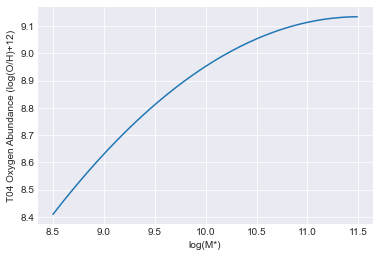

In [23]:
# Calculate T04 MZ polynomial fit
mass = np.arange(8.5, 11.5, .01) # Log(M*) 8.5 < logM* > 11.5
mass.shape
T04_Z_fit = -1.492 + 1.847*(mass) - 0.08026*(mass)**2
plt.plot(mass, T04_Z_fit, label='T04 fit')
plt.xlabel('log(M*)')
plt.ylabel('T04 Oxygen Abundance (log(O/H)+12)')

# Calculate NII/OII MZ polynomial fit
#nii_oii_fit = 
#nii_oii = plt.plot(mass, ) 

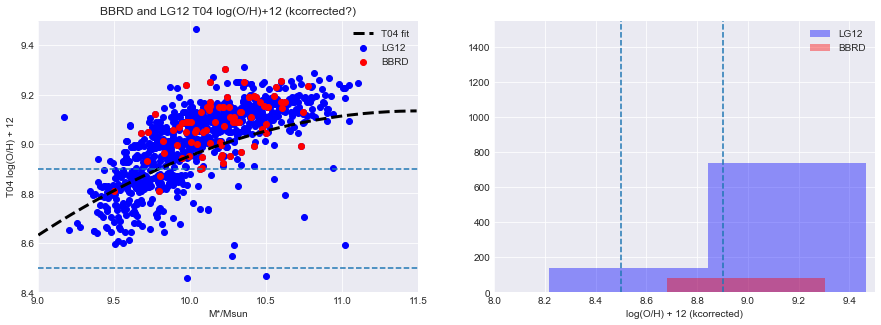

In [24]:
#Metallicty Measurments? from https://wwwmpa.mpa-garching.mpg.de/SDSS/DR7/oh.html #Need to double check because documentation is not clear
#BBRD
bbrd_T04_Z_med = bbrd['Metallicity_med(T04)']
# mask -99.99 bad values
bbrd_mask = (bbrd['Metallicity_med(T04)'] <= -99.9)

#LG12
lg12_T04_Z_med = lg12['Metallicity_med(T04)']
# mask -99.99 bad values
lg12_mask = (lg12['Metallicity_med(T04)'] <= -99.9)

# Mass
bbrd_Mstar_med = bbrd['Mstarmed_SDSStotlgm']
lg12_Mstar_med = lg12['Mstarmed_SDSStotlgm']

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
#sns.kdeplot(lg12_Mstar_med, lg12_T04_Z_med, shade=True, label='LG12', ax=ax1)
ax1.scatter(lg12_Mstar_med[~lg12_mask], lg12_T04_Z_med[~lg12_mask], label='LG12', color='blue')
ax1.scatter(bbrd_Mstar_med[~bbrd_mask], bbrd_T04_Z_med[~bbrd_mask], label='BBRD', color='red')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax1.set_xlabel('M*/Msun')
ax1.set_ylabel('T04 log(O/H) + 12')
ax1.set_ylim(8.4, 9.5)
ax1.set_xlim(9.0, 11.5)
ax1.axhline(8.5, linestyle='--')
ax1.axhline(8.9, linestyle='--')
ax1.set_title('BBRD and LG12 T04 log(O/H)+12 (kcorrected?)')
ax1.legend()


sns.distplot(lg12_T04_Z_med, bins=175, label='LG12', color='blue',ax=ax2, kde=False)
sns.distplot(bbrd_T04_Z_med, bins=175, label='BBRD', color='red', ax=ax2, kde=False)
ax2.legend()
ax2.set_xlim((8,9.5))
ax2.set_ylim(0,1550)
ax2.axvline(8.5, linestyle='--')
ax2.axvline(8.9, linestyle='--')
ax2.set_xlabel('log(O/H) + 12 (kcorrected)')
plt.savefig('prelim_BBRD_LG12_MZrelation_T04_compare_nodc.jpeg')
plt.show()

In [25]:
lg12.columns

Index(['RASDSSinfo', 'DecSDSSinfo', 'zSDSSinfo',
       'HalphaSDSSline [1e-17*erg/cm^2/s]',
       'OIII5007SDSSline [1e-17*erg/cm^2/s]',
       'OIII4959SDSSline [1e-17*erg/cm^2/s]',
       'HbetaSDSSline [1e-17*erg/cm^2/s]', 'HdeltaSDSSline [1e-17*erg/cm^2/s]',
       'N6583SDSS [1e-17*erg/cm^2/s]', 'S6717SDSSline [1e-17*erg/cm^2/s]',
       'S6731SDSSline [1e-17*erg/cm^2/s]',
       'OII3726SDSSline [1e-17*erg/cm^2/s]',
       'OII3729SDSSline [1e-17*erg/cm^2/s]',
       'OI6300SDSSline [1e-17*erg/cm^2/s]', 'HalphaSDSSline_ERR',
       'OIII5007SDSSline_ERR', 'OIII4959SDSSline_ERR', 'HbetaSDSSline_ERR',
       'HdeltaSDSSline_ERR', 'N6583SDSS_ERR', 'S6717SDSSline_ERR',
       'S6731SDSSline_ERR', 'OII3726SDSSline_ERR', 'OII3729SDSSline_ERR',
       'OI6300SDSSline_ERR', 'Dn4000SDSSindx', 'petroRad', 'petroRadE',
       'petroR50', 'petroR50E', 'petroR90', 'petroR90E',
       'Metallicity_med(T04)', 'Metallicity_avg(T04)', 'Mstaravg_SDSStotlgm',
       'Mstarmed_SDSStotlgm', 'SFR_fl

# Step1 extinction correct BBRD and Parent sample
# Step2 Compute metallicity diagnostics and metallicity
# Step3 Plot mass-metalicity relation of parent and BBRD sample

# 1. Extinction correction Calzetti et al. 2000


In [26]:
#BBRD sample
bbrd_bdec = balmer_dec(bbrd_Halpha_emline, bbrd_Hbeta_emline)
bbrd_ha_int_flux = c00_kcorr(bbrd_Halpha_emline, .6564, (bbrd_bdec), Rv=4.05)
bbrd_hb_int_flux = c00_kcorr(bbrd_Hbeta_emline, .4864, (bbrd_bdec), Rv=4.05)
bbrd_oiii5007_int_flux = c00_kcorr(bbrd_OIII5007_emline, .5007, (bbrd_bdec), Rv=4.05)
bbrd_oiii4959_int_flux = c00_kcorr(bbrd_OIII4959_emline, .4959, (bbrd_bdec), Rv=4.05)
bbrd_sii6716_int_flux = c00_kcorr(bbrd_SII6716_emline, .6716, (bbrd_bdec), Rv=4.05)
bbrd_sii6731_int_flux = c00_kcorr(bbrd_SII6731_emline, .6731, (bbrd_bdec), Rv=4.05)
bbrd_nii6583_int_flux = c00_kcorr(bbrd_NII6583_emline, .6583, (bbrd_bdec), Rv=4.05)
bbrd_oii3726_int_flux = c00_kcorr(bbrd_OII3726_emline, .3726, (bbrd_bdec), Rv=4.05)
bbrd_oii3729_int_flux = c00_kcorr(bbrd_OII3729_emline, .3729, (bbrd_bdec), Rv=4.05)

# Add intrinsic fluxes to dataframe
bbrd['Halpha_kcorr'] = bbrd_ha_int_flux
bbrd['Hbeta_kcorr'] = bbrd_hb_int_flux 
bbrd['OIII5007_kcorr'] = bbrd_oiii5007_int_flux
bbrd['OIII4959_kcorr'] = bbrd_oiii4959_int_flux
bbrd['SII6716_kcorr'] = bbrd_sii6716_int_flux 
bbrd['SII6731_kcorr'] = bbrd_sii6731_int_flux 
bbrd['NII6583_kcorr'] = bbrd_nii6583_int_flux 
bbrd['OII3726_kcorr'] = bbrd_oii3726_int_flux 
bbrd['OII3729_kcorr'] = bbrd_oii3729_int_flux 

#LG12 sample
lg12_bdec = balmer_dec(lg12_Halpha_emline, lg12_Hbeta_emline)
lg12_ha_int_flux = c00_kcorr(lg12_Halpha_emline, .6564, (lg12_bdec), Rv=4.05)
lg12_hb_int_flux = c00_kcorr(lg12_Hbeta_emline, .4864, (lg12_bdec), Rv=4.05)
lg12_oiii5007_int_flux = c00_kcorr(lg12_OIII5007_emline, .5007, (lg12_bdec), Rv=4.05)
lg12_oiii4959_int_flux = c00_kcorr(lg12_OIII4959_emline, .4959, (lg12_bdec), Rv=4.05)
lg12_sii6716_int_flux = c00_kcorr(lg12_SII6716_emline, .6716, (lg12_bdec), Rv=4.05)
lg12_sii6731_int_flux = c00_kcorr(lg12_SII6731_emline, .6731, (lg12_bdec), Rv=4.05)
lg12_nii6583_int_flux = c00_kcorr(lg12_NII6583_emline, .6583, (lg12_bdec), Rv=4.05)
lg12_oii3726_int_flux = c00_kcorr(lg12_OII3726_emline, .3726, (lg12_bdec), Rv=4.05)
lg12_oii3729_int_flux = c00_kcorr(lg12_OII3729_emline, .3729, (lg12_bdec), Rv=4.05)

# Add intrinsic fluxes to dataframe
lg12['Halpha_kcorr'] = lg12_ha_int_flux
lg12['Hbeta_kcorr'] = lg12_hb_int_flux 
lg12['OIII5007_kcorr'] = lg12_oiii5007_int_flux
lg12['OIII4959_kcorr'] = lg12_oiii4959_int_flux
lg12['SII6716_kcorr'] = lg12_sii6716_int_flux 
lg12['SII6731_kcorr'] = lg12_sii6731_int_flux 
lg12['NII6583_kcorr'] = lg12_nii6583_int_flux 
lg12['OII3726_kcorr'] = lg12_oii3726_int_flux 
lg12['OII3729_kcorr'] = lg12_oii3729_int_flux 

    0.098491
1      0.335855
2      0.178494
3      0.273219
4      0.158296
         ...   
121    0.241182
122    0.288008
123    0.119075
124    0.093000
125    0.090351
Length: 126, dtype: float64
E(B-V)gas=0      0.084214
1      0.287170
2      0.152620
3      0.233613
4      0.135350
         ...   
121    0.206220
122    0.246259
123    0.101814
124    0.079519
125    0.077254
Length: 126, dtype: float64
E(B-V)star=0      0.037054
1      0.126355
2      0.067153
3      0.102790
4      0.059554
         ...   
121    0.090737
122    0.108354
123    0.044798
124    0.034988
125    0.033992
Length: 126, dtype: float64
intrinsic_flux = 0       60.577247
1       20.492253
2       33.360826
3       10.094010
4       48.516977
          ...    
121    899.070985
122     25.852679
123     29.304580
124    119.399900
125     37.991490
Length: 126, dtype: float64 1e-17erg/cm^2/s

Observe Flux = 0      406.539215
1       89.778923
2      140.968643
3       72.448547
4      101.488846
     

# 2. Compute Metallicty

In [27]:
# BBRD
bbrd_Mstar_med = bbrd['Mstarmed_SDSStotlgm']
bbrd_niioii_Z = NII_OII(bbrd_nii6583_int_flux, bbrd_oii3726_int_flux)
#bbrd_niioii_Z[np.where(bbrd_niioii_Z == np.inf)] = 0
bbrd_r23_Z = R23(bbrd_oiii5007_int_flux, bbrd_oiii4959_int_flux, bbrd_oii3726_int_flux, bbrd_hb_int_flux)

# Append metallicity to dataframe
bbrd['Log(O/H)+12 [NII/OII]'] = bbrd_niioii_Z
bbrd['Log(O/H)+12 [R23]'] = bbrd_r23_Z

# Convert inf values to 0 for Metallicty 
#bbrd_niioii_Z[np.where(bbrd_niioii_Z == np.inf)] = 0
#bbrd_niioii_Z[np.where(bbrd_niioii_Z == np.nan)] = 0
#bbrd_r23_Z[np.where(bbrd_r23_Z == np.inf)] = 0
#bbrd_r23_Z[np.where(bbrd_r23_Z == np.nan)] = 0

#--------------------------------------------------------------------
# LG12
lg12_Mstar_med = lg12['Mstarmed_SDSStotlgm']
lg12_niioii_Z = NII_OII(lg12_nii6583_int_flux, lg12_oii3726_int_flux)
lg12_r23_Z = R23(lg12_oiii5007_int_flux, lg12_oiii4959_int_flux, lg12_oii3726_int_flux, lg12_hb_int_flux)

# Append metallicity to dataframe
lg12['Log(O/H)+12 [NII/OII]'] = lg12_niioii_Z
lg12['Log(O/H)+12 [R23]'] = lg12_r23_Z

# Convert inf values to 0 for Metallicty
#lg12_niioii_Z[np.where(lg12_niioii_Z == np.inf)] = 0
#lg12_niioii_Z[np.where(lg12_niioii_Z == np.nan)] = 0
#lg12_r23_Z[np.where(lg12_r23_Z == np.inf)] = 0
#lg12_r23_Z[np.where(lg12_r23_Z == np.nan)] = 0



## Data cleaning

In [28]:
# Remove galaxies with null metallicity measurments

lg12_niioii = lg12['Log(O/H)+12 [NII/OII]']
bbrd_niioii = bbrd['Log(O/H)+12 [NII/OII]']

# Make filter masking values 
lg12_mask_niioii = (lg12_niioii == np.inf) #& (lg12_niioii == np.nan)#pd.isna(lg12_niioii)
bbrd_mask_niioii = (bbrd_niioii == np.inf) #& pd.isna(bbrd_niioii)

# good values
lg12_good = lg12[~lg12_mask_niioii] 
lg12_good = lg12_good[~pd.isna(lg12_niioii)]

bbrd_good = bbrd[~bbrd_mask_niioii] 
bbrd_good = bbrd_good[~pd.isna(bbrd_niioii)]

# bad values
lg12_null = lg12[lg12_mask_niioii] 
lg12_null = lg12_null[pd.isna(lg12_niioii)]

bbrd_null = bbrd[bbrd_mask_niioii] 
bbrd_null = bbrd_null[pd.isna(bbrd_niioii)]

# Remove
lg12 = lg12_good
bbrd = bbrd_good

 ## 2.1 Make a text file with the intrinsic flux 

In [29]:
#bbrd_txt = Table()
#
#bbrd_txt['Mstarmed_SDSStotlgm'] = bbrd_Mstar_med
#bbrd_txt['Halpha/Hbeta'] = bbrd_bdec
#bbrd_txt['ha'] = bbrd_ha_int_flux
#bbrd_txt['hb'] = bbrd_hb_int_flux
#bbrd_txt['oiii5007 int flux[ergs/cm^2/s]'] = bbrd_oiii5007_int_flux
#bbrd_txt['oiii4959 int flux[ergs/cm^2/s]'] = bbrd_oiii4959_int_flux
#bbrd_txt['sii6716 int flux[ergs/cm^2/s]'] = bbrd_sii6716_int_flux
#bbrd_txt['sii6731 int flux[ergs/cm^2/s]'] = bbrd_sii6731_int_flux
#bbrd_txt['nii6583 int flux[ergs/cm^2/s]'] = bbrd_nii6583_int_flux
#bbrd_txt['oii3726 int flux[ergs/cm^2/s]'] = bbrd_oii3726_int_flux
#bbrd_txt['oii3729 int flux[ergs/cm^2/s]'] = bbrd_oii3729_int_flux
#bbrd_txt['Log(O/H)+12 [NII/OII]'] = bbrd_nii6583_int_flux
#bbrd_txt['Log(O/H)+12 [R23]'] = bbrd_r23_Z
#
#
#bbrd_txt.write('bbrd_intFZ.txt', overwrite=True, format='ascii')
#bbrd_txt.write('bbrd_intFZ_neat.txt', overwrite=True, format='ascii.fixed_width')
#

In [30]:
lg12.columns

Index(['RASDSSinfo', 'DecSDSSinfo', 'zSDSSinfo',
       'HalphaSDSSline [1e-17*erg/cm^2/s]',
       'OIII5007SDSSline [1e-17*erg/cm^2/s]',
       'OIII4959SDSSline [1e-17*erg/cm^2/s]',
       'HbetaSDSSline [1e-17*erg/cm^2/s]', 'HdeltaSDSSline [1e-17*erg/cm^2/s]',
       'N6583SDSS [1e-17*erg/cm^2/s]', 'S6717SDSSline [1e-17*erg/cm^2/s]',
       'S6731SDSSline [1e-17*erg/cm^2/s]',
       'OII3726SDSSline [1e-17*erg/cm^2/s]',
       'OII3729SDSSline [1e-17*erg/cm^2/s]',
       'OI6300SDSSline [1e-17*erg/cm^2/s]', 'HalphaSDSSline_ERR',
       'OIII5007SDSSline_ERR', 'OIII4959SDSSline_ERR', 'HbetaSDSSline_ERR',
       'HdeltaSDSSline_ERR', 'N6583SDSS_ERR', 'S6717SDSSline_ERR',
       'S6731SDSSline_ERR', 'OII3726SDSSline_ERR', 'OII3729SDSSline_ERR',
       'OI6300SDSSline_ERR', 'Dn4000SDSSindx', 'petroRad', 'petroRadE',
       'petroR50', 'petroR50E', 'petroR90', 'petroR90E',
       'Metallicity_med(T04)', 'Metallicity_avg(T04)', 'Mstaravg_SDSStotlgm',
       'Mstarmed_SDSStotlgm', 'SFR_fl

## 2.2 Use the BPT diagrams to classify galaxies and remove agn

In [31]:
# NII/Halpha and OIII/Hbeta kcorr
lg12_n2ha_ratio = np.log10(lg12['NII6583_kcorr'] / lg12['Halpha_kcorr'])
lg12_o3hb_ratio = np.log10(lg12['OIII5007_kcorr'] / lg12['Hbeta_kcorr'])

bbrd_n2ha_ratio = np.log10(bbrd['NII6583_kcorr'] / bbrd['Halpha_kcorr'])
bbrd_o3hb_ratio = np.log10(bbrd['OIII5007_kcorr'] / bbrd['Hbeta_kcorr'])

# Add to pandas dataframe
lg12['NII/Halpha'] = lg12_n2ha_ratio
lg12['OIII/Hbeta'] = lg12_o3hb_ratio

bbrd['NII/Halpha'] = bbrd_n2ha_ratio
bbrd['OIII/Hbeta'] = bbrd_o3hb_ratio

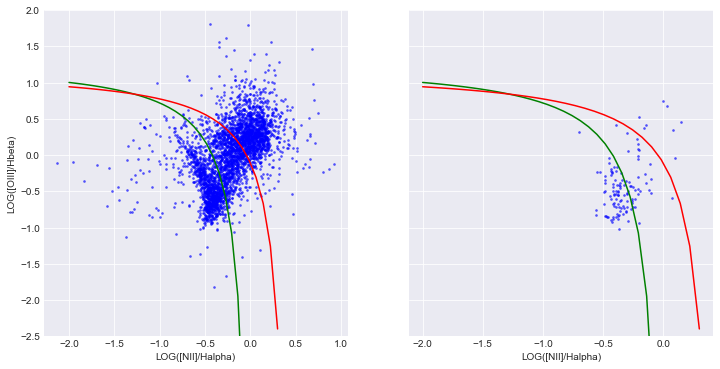

In [32]:
# Plot BPT for LG12 and BBRD
n2ha_sf_range = np.linspace(-2.0,0.0,30)
n2ha_comp_range = np.linspace(-2.0,0.3,30)
ka03_comp = (0.61 / (n2ha_sf_range - 0.05)) + 1.3
ke01_sf = (0.61 / (n2ha_comp_range - 0.47)) + 1.19

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
ax1.scatter(lg12_n2ha_ratio, lg12_o3hb_ratio, color='blue', s=3, alpha=0.5)
ax1.set_ylim(-2.5,2.0)
ax1.set_xlabel('LOG([NII]/Halpha)')
ax1.set_ylabel('LOG([OIII]/Hbeta)')


ax2.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
ax2.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
ax2.scatter(bbrd_n2ha_ratio, bbrd_o3hb_ratio, color='blue', s=3, alpha=0.5)
ax2.set_xlabel('LOG([NII]/Halpha)')
plt.show()

In [33]:
# Label the sf, comp, agn dataframe
lg12_agn_mask = (lg12['OIII/Hbeta'] > (0.61 / (lg12['NII/Halpha'] - 0.47)) + 1.19) | (lg12['NII/Halpha']>0.3)
lg12_agn = lg12[lg12_agn_mask]
lg12_sf = lg12[~lg12_agn_mask]

bbrd_agn_mask = bbrd['OIII/Hbeta'] > (0.61 / (bbrd['NII/Halpha'] - 0.47)) + 1.19
bbrd_agn = bbrd[bbrd_agn_mask]
bbrd_sf = bbrd[~bbrd_agn_mask]

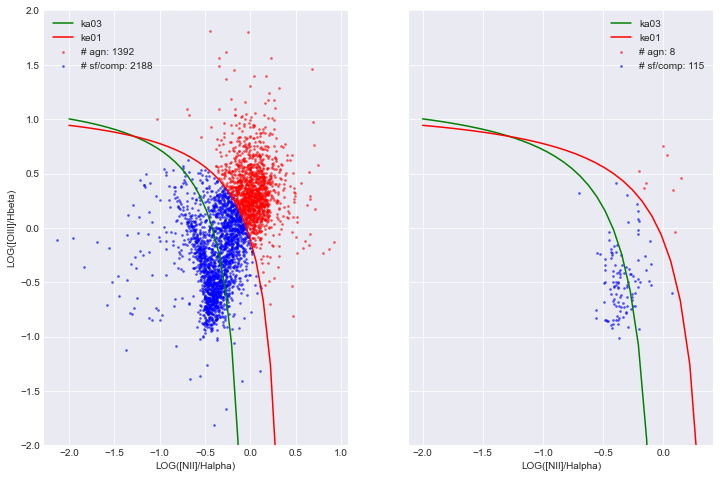

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8), sharey=True)
ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
ax1.scatter(lg12_agn['NII/Halpha'], lg12_agn['OIII/Hbeta'], color='red', s=3, alpha=0.5, label='# agn: {}'.format(len(lg12_agn)))
ax1.scatter(lg12_sf['NII/Halpha'], lg12_sf['OIII/Hbeta'], color='blue', s=3, alpha=0.5, label='# sf/comp: {}'.format(len(lg12_sf)))
ax1.set_ylim(-2.0,2.0)
ax1.set_xlabel('LOG([NII]/Halpha)')
ax1.set_ylabel('LOG([OIII]/Hbeta)')
ax1.legend()


ax2.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
ax2.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
ax2.scatter(bbrd_agn['NII/Halpha'], bbrd_agn['OIII/Hbeta'], color='red', s=3, alpha=0.5, label='# agn: {}'.format(len(bbrd_agn)))
ax2.scatter(bbrd_sf['NII/Halpha'], bbrd_sf['OIII/Hbeta'], color='blue', s=3, alpha=0.5,label='# sf/comp: {}'.format(len(bbrd_sf)))
ax2.set_xlabel('LOG([NII]/Halpha)')
ax2.legend()
plt.savefig('Global_lg12_bbrd_jpg')
plt.show()

In [35]:
lg12 = lg12_sf
bbrd = bbrd_sf

In [36]:
# Make readable csv file with all star-forming galaxies
lg12.to_csv('lg12_sf_reduced.txt', sep=',')
bbrd.to_csv('bbrd_sf_reduced.txt', sep=',')

# 3. Plot MZ relation 

### non k corrected MZ relation

In [37]:
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
#sns.kdeplot(lg12_Mstar_med, lg12_int_Z, shade=True, label='LG12', ax=ax1, color='blue')
##sns.kdeplot(bbrd_Mstar_med, bbrd_int_Z, shade=False, label='LG12', ax=ax1, color='red')
##ax1.scatter(lg12_Mstar_med, lg12_int_Z, label='LG12', alpha=0.5, color='blue')
#ax1.scatter(bbrd_Mstar_med, bbrd_int_Z, label='BBRD', alpha=1.0, color='red')
##sns.kdeplot(lg12_Mstar_med, lg12_int_Z, shade=False, label='LG12', ax=ax1, color='orange')
#
#
#ax1.set_xlabel('Mstar/Msun')
#ax1.set_ylabel('log(O/H) + 12 (Not kcorrected)')
#ax1.axhline(8.6, linestyle='--', color='red')
#ax1.set_ylim(8.4,9.8)
#ax1.set_xlim(9.0, 11.2)
#ax1.set_title('log(O/H) + 12 (Not kcorrected)')
#ax1.legend()
#
#sns.distplot(lg12_int_Z, bins=50, ax=ax2, label='LG12', kde=True, hist=False, rug=True)
#sns.distplot(bbrd_int_Z, bins=50, ax=ax2, label='BBRD', kde=True, hist = False, rug=True, color='red')
##sns.distplot(T04_Z_med,  bins=150, ax=ax2, label='T04 (BBRD sample)', kde=True, hist=False, rug=True, #color='green')
#ax2.set_xlabel('log(O/H) + 12 (Not kcorrected)')
#ax2.set_xlim((8.4,10))
#ax2.axvline(8.6, linestyle='--', color='red')
#ax2.legend()
#plt.savefig('prelim_BBRD_parent_MZrelation_compare_nodc.jpeg')
#plt.show()


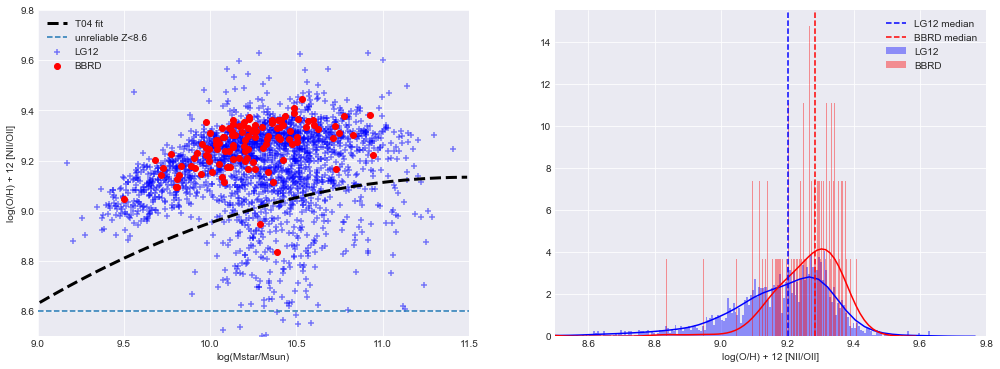

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,6))
# Make mask to remove inf values
# lg12_no_inf_mask = (lg12_niioii_Z == np.inf)
# bbrd_no_inf_mask = (bbrd_niioii_Z == np.inf)

lg12_Mstar_med = lg12['Mstarmed_SDSStotlgm']
lg12_niioii_Z = lg12['Log(O/H)+12 [NII/OII]']

bbrd_Mstar_med = bbrd['Mstarmed_SDSStotlgm']
bbrd_niioii_Z = bbrd['Log(O/H)+12 [NII/OII]']

# Plot MZ relation
ax1.scatter(lg12_Mstar_med, lg12_niioii_Z, color='blue', label='LG12', marker='+', alpha=.5)
scatters = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, label='BBRD', color='red')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax1.set_ylabel('log(O/H) + 12 [NII/OII]')
ax1.set_xlabel('log(Mstar/Msun)')
ax1.set_ylim(8.5,9.8)
ax1.set_xlim(9,11.5)
ax1.axhline(8.6, linestyle='--', label='unreliable Z<8.6')
ax1.legend()

# SFR colorbar
#scatters = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_avgSFR, cmap='magma', label='BBRD')
#fig.colorbar(scatters, ax=ax1)
#scatters.set_clim(8.5, 10)

sns.distplot(lg12_niioii_Z, bins=425, kde=True, ax=ax2, color='blue', label='LG12')
sns.distplot(bbrd_niioii_Z, bins=425, kde=True, ax=ax2, color='red',  label='BBRD')
ax2.set_xlabel('log(O/H) + 12 [NII/OII]')
ax2.set_xlim(8.5,9.8)
ax2.axvline(np.median(lg12_niioii_Z), linestyle='--', color='blue', label='LG12 median')
ax2.axvline(np.median(bbrd_niioii_Z), linestyle='--', color='red', label='BBRD median')
ax2.legend()

plt.savefig('allgal_MZR.jpg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)


# 3.1 Compare NII/OII and R23 metallicty measurments to T04 from value added catalog 

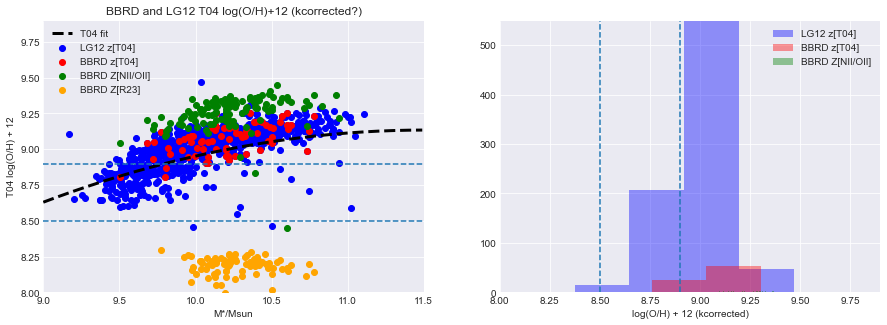

In [39]:
#Metallicty Measurments? from https://wwwmpa.mpa-garching.mpg.de/SDSS/DR7/oh.html #Need to double check because documentation is not clear
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
lg12_T04_Z_med = lg12['Metallicity_med(T04)']
bbrd_T04_Z_med = bbrd['Metallicity_med(T04)']
bbrd_r23_Z = bbrd['Log(O/H)+12 [R23]']
# Make mask to remove inf values
# lg12_no_inf_mask = (lg12_niioii_Z == np.inf)
# bbrd_no_inf_mask = (bbrd_niioii_Z == np.inf)
# bbrd_no_inf_mask = (bbrd_niioii_Z == np.inf)

# sns.kdeplot(lg12_Mstar_med, lg12_T04_Z_med, shade=True, label='LG12', ax=ax1)
ax1.scatter(lg12_Mstar_med, lg12_T04_Z_med, label='LG12 z[T04]', color='blue')
ax1.scatter(bbrd_Mstar_med, bbrd_T04_Z_med, label='BBRD z[T04]', color='red') #T04
ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, color='green', label='BBRD Z[NII/OII]') #NII/OII
ax1.scatter(bbrd_Mstar_med, bbrd_r23_Z, color='orange', label='BBRD Z[R23]') #R23
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--') #T04 fit

#ax1.scatter(lg12_Mstar_med, lg12_niioii_Z, color='yellow', label='LG12', marker='+', alpha=.5)

ax1.set_xlabel('M*/Msun')
ax1.set_ylabel('T04 log(O/H) + 12')
ax1.set_ylim(8.0, 9.9)
ax1.set_xlim(9.0, 11.5)
ax1.axhline(8.5, linestyle='--')
ax1.axhline(8.9, linestyle='--')
ax1.set_title('BBRD and LG12 T04 log(O/H)+12 (kcorrected?)')
ax1.legend()


sns.distplot(lg12_T04_Z_med, bins=400, label='LG12 z[T04]', color='blue',ax=ax2, kde=False)
sns.distplot(bbrd_T04_Z_med, bins=400, label='BBRD z[T04]', color='red', ax=ax2, kde=False)
sns.distplot(bbrd_niioii_Z, bins=400, label='BBRD Z[NII/OII]', color='green', ax=ax2, kde=False)
ax2.legend()
# Note: A lot of bad values in T04 measurments
ax2.set_xlim((8,9.9))
ax2.set_ylim(0,550)

# unreliable for NII/OII measurents (double check)
ax2.axvline(8.5, linestyle='--')
ax2.axvline(8.9, linestyle='--')
ax2.set_xlabel('log(O/H) + 12 (kcorrected)')
plt.savefig('prelim_BBRD_LG12_MZrelation_T04_compare_nodc.jpeg')
plt.show()

# replace horzontal histogram with vertical

# 4 Plot SFR colorbar of MZ relation (FMR)

,RASDSSinfo,DecSDSSinfo,zSDSSinfo,HalphaSDSSline [1e-17*erg/cm^2/s],OIII5007SDSSline [1e-17*erg/cm^2/s],OIII4959SDSSline [1e-17*erg/cm^2/s],HbetaSDSSline [1e-17*erg/cm^2/s],HdeltaSDSSline [1e-17*erg/cm^2/s],N6583SDSS [1e-17*erg/cm^2/s],S6717SDSSline [1e-17*erg/cm^2/s],S6731SDSSline [1e-17*erg/cm^2/s],OII3726SDSSline [1e-17*erg/cm^2/s],OII3729SDSSline [1e-17*erg/cm^2/s],OI6300SDSSline [1e-17*erg/cm^2/s],HalphaSDSSline_ERR,OIII5007SDSSline_ERR,OIII4959SDSSline_ERR,HbetaSDSSline_ERR,HdeltaSDSSline_ERR,N6583SDSS_ERR,S6717SDSSline_ERR,S6731SDSSline_ERR,OII3726SDSSline_ERR,OII3729SDSSline_ERR,OI6300SDSSline_ERR,Dn4000SDSSindx,petroRad,petroRadE,petroR50,petroR50E,petroR90,petroR90E,Metallicity_med(T04),Metallicity_avg(T04),Mstaravg_SDSStotlgm,Mstarmed_SDSStotlgm,SFR_flag_all,totalSFR_Avg,totalSFR_Med,fibSFR_avg_all,fibSFR_med_all,fibsSFR_avg_all,fibsSFR_med_all,sSFR_avg_all,sSFR_med_all,sSFR_flag_all,avgSFRD,medSFRD,Halpha_kcorr,Hbeta_kcorr,OIII5007_kcorr,OIII4959_kcorr,SII6716_kcorr,SII6731_kcorr,NII6583_kcorr,OII3726_kcorr,OII3729_kcorr,Log(O/H)+12 [NII/OII],Log(O/H)+12 [R23],NII/Halpha,OIII/Hbeta
2,121.680412,45.660568,0.034259,1142.312134,67.043716,25.244350,264.803894,65.174156,671.672668,140.968643,145.317261,171.198746,90.614594,17.255672,12.194876,4.078231,3.703409,5.406204,4.345345,7.602035,4.826979,4.675019,8.547088,7.868248,3.429440,1.315829,4.966561,0.064525,2.050702,0.013455,6.196133,0.092379,-99.900002,-99.900002,10.044665,10.032765,0.0,-0.02448,-0.02448,-0.252370,-0.234049,-9.775115,-9.755755,-10.101339,-10.135715,0,-0.000316,-0.000316,1403.143840,351.850745,88.361062,33.360826,172.138789,177.348267,824.419897,245.970370,130.159196,9.282480,8.217435,-0.230954,-0.600098
38,132.912735,57.107433,0.025606,2449.226318,147.633316,55.618504,637.827087,158.346390,1068.344849,455.392761,347.778809,373.897858,326.486481,42.607132,21.321924,4.987577,4.242277,8.534572,4.936537,10.332883,7.691811,6.930407,10.139729,9.976254,3.961817,1.208648,10.164476,0.147293,3.851963,0.029219,11.850395,0.156796,9.089487,9.098046,9.988571,9.973207,0.0,0.06386,0.06386,-0.213696,-0.226946,-9.528990,-9.543462,-9.962530,-10.011456,0,0.000197,0.000197,2838.305980,781.971639,179.945467,67.922617,525.509228,401.162790,1237.392870,484.817072,423.267084,9.248730,8.253566,-0.360552,-0.638050
49,163.219131,43.428398,0.024237,1609.376831,50.252644,26.773079,353.503693,78.127609,656.529846,162.794769,122.592201,87.993179,81.776001,30.103802,11.396041,3.374664,3.294860,4.799489,3.089344,6.508108,4.339685,4.185889,5.683006,5.665340,3.341714,1.268466,5.355245,0.052384,2.237174,0.006362,6.323402,0.039616,9.237294,9.256870,9.988233,9.974014,0.0,0.08858,0.08858,-0.026996,-0.047432,-9.454480,-9.476850,-9.937719,-9.967026,0,0.000983,0.000983,2030.888302,487.542161,68.672502,36.698254,204.066516,153.573171,827.776947,132.576473,123.175400,9.353825,8.157312,-0.389773,-0.851229
40,198.189117,46.934990,0.027681,1333.008545,39.205406,15.436816,272.489105,61.633663,436.770294,144.585220,114.532784,78.454498,55.282948,17.865793,12.125191,3.497308,3.208759,4.934665,3.856958,6.031912,4.511158,4.236085,6.461460,6.800579,3.247117,1.214740,15.065123,0.213885,6.946040,0.023260,14.894194,0.111340,9.170087,9.180215,10.485907,10.463795,0.0,0.36468,0.36468,0.052250,0.018745,-9.440140,-9.464718,-10.159039,-10.211385,0,0.000511,0.000511,1743.747134,394.963454,56.226600,22.216790,187.684979,148.563980,570.790977,125.939691,88.715228,9.318006,8.197677,-0.485006,-0.846615
109,221.437973,51.580814,0.029627,3323.410156,186.457779,77.655319,390.332825,4.638072,2656.320312,562.597290,562.555542,213.777588,226.029999,131.181534,32.791138,11.583912,11.036526,11.703433,8.482546,26.093674,16.520447,16.575312,20.653061,19.777548,12.565891,1.351458,15.093667,0.665167,6.207129,0.032315,17.654314,0.199443,-99.900002,-99.900002,10.937696,10.924791,0.0,1.13247,1.13247,1.070642,1.106940,-9.083599,-9.047050,-9.849570,-9.861681,0,0.001582,0.001582,5736.694446,829.984164,388.009277,162.756262,956.042498,95

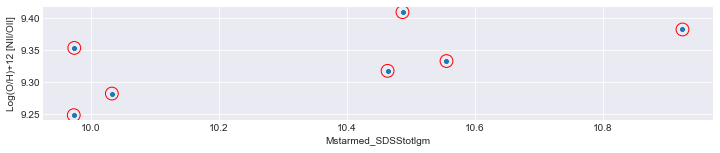

In [40]:
# Find MaNGA galaxies RA and Dec in BBRD sample

# List of MaNGA RA + DEC
#121.921 | 39.004 |#AGN 
#132.913 | 57.107 |# SF 
#163.219 | 43.428 |# SF 
#198.189 | 46.935 |# SF 
#221.438 | 51.581 |# Possible Merger 
#247.304 | 41.151 |#SF 
#247.674 | 40.529 |#SF 

#np.where(bbrd['RASDSSinfo']==121.92)
#bbrd.loc[( == ) & (bbrd['DecSDSSinfo'] == 39.004246)]
#bbrd_agn1 = (bbrd['RASDSSinfo'] == 121.92081)
#agn1 = bbrd[bbrd_agn1]
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

#All dataset RA and DEC
all_ra = bbrd['RASDSSinfo']
all_dec = bbrd['DecSDSSinfo']

#Picking out MaNGA data points
manga_ra = [121.921 ,132.913, 163.219 ,198.189 ,221.438 ,247.304 ,247.674]
manga_dec = [39.004 ,57.107 ,43.428 ,46.935 ,51.581 ,41.151 ,40.529]

manga_ra_match = []
num = 0
for ra in manga_ra:
    match = np.where(all_ra==find_nearest(all_ra, manga_ra[num]))
    num += 1
    match = match[0][0]
    manga_ra_match.append(match)
manga_ra_match


manga_data = bbrd.iloc[manga_ra_match]
manga_mass = manga_data['Mstarmed_SDSStotlgm']
manga_Z = manga_data['Log(O/H)+12 [NII/OII]']
fig, axes = plt.subplots(figsize = (12,8))
sns.scatterplot(manga_mass, manga_Z)
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.01, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.01, fill=False, color='red')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.01, fill=False, color='red')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.01, fill=False, color='red')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.01, fill=False, color='red')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.01, fill=False, color='red')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.01, fill=False, color='red')
axes.set_aspect(1)
axes.add_artist(g0)
axes.add_artist(g1)
axes.add_artist(g2)
axes.add_artist(g3)
axes.add_artist(g4)
axes.add_artist(g5)
axes.add_artist(g6)


manga_data.head(n=7)
# There is a better way to run this code but this is a problem for a later day

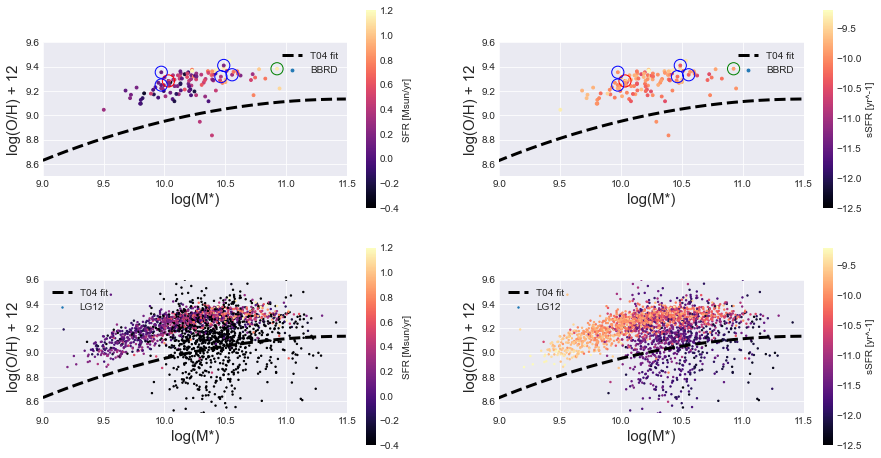

In [41]:
#x = np.linspace(0, 10, num=100)
#y = x ** 2 + 10 * np.random.randn(100)
#x = bbrd_Mstar_med
#y = bbrd_niioii_Z
#z = bbrd_medSFR
#a = bbrd_med_sSFR
bbrd_avgSFR = bbrd['totalSFR_Med']
bbrd_med_sSFR = bbrd['sSFR_med_all']
lg12_avgSFR = lg12['totalSFR_Med']
lg12_med_sSFR = lg12['sSFR_med_all']

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15,8))

# BBRD
scatters1 = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_avgSFR, cmap='magma', label='BBRD', s=8)
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='SFR [Msun/yr]')
ax1.set_xlim(9.0, 11.5)
ax1.set_ylim(8.5, 9.6)
ax1.set_xlabel('log(M*)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters1.set_clim(-0.4, 1.2)
ax1.legend()

# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue')
ax1.set_aspect(1)
ax1.add_artist(g0)
ax1.add_artist(g1)
ax1.add_artist(g2)
ax1.add_artist(g3)
ax1.add_artist(g4)
ax1.add_artist(g5)
ax1.add_artist(g6)


scatters2 = ax2.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_med_sSFR, cmap='magma', label='BBRD', s=8)
fig.colorbar(scatters2, ax=ax2, label='sSFR [yr^-1]')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_xlim(9.0, 11.5)
ax2.set_ylim(8.5, 9.6)
ax2.set_xlabel('log(M*)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
scatters2.set_clim(-12.5, -9.2)


# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue', label='MaNGA')

ax2.set_aspect(1)
ax2.add_artist(g0)
ax2.add_artist(g1)
ax2.add_artist(g2)
ax2.add_artist(g3)
ax2.add_artist(g4)
ax2.add_artist(g5)
ax2.add_artist(g6)
ax2.legend()


# LG12
scatters3 = ax3.scatter(lg12_Mstar_med, lg12_niioii_Z, c=lg12_avgSFR, cmap='magma', label='LG12', s=2)
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='SFR [Msun/yr]')
ax3.set_xlim(9.0, 11.5)
ax3.set_ylim(8.5, 9.6)
ax3.set_xlabel('log(M*)', fontsize=15)
ax3.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters3.set_clim(-0.4, 1.2)
ax3.legend()
ax3.set_aspect(1)


scatters4 = ax4.scatter(lg12_Mstar_med, lg12_niioii_Z, c=lg12_med_sSFR, cmap='magma', label='LG12', s=2)
fig.colorbar(scatters4, ax=ax4, label='sSFR [yr^-1]')
#fig.cbar.ax.tick_params(labelsize=4)
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_xlim(9.0, 11.5)
ax4.set_ylim(8.5, 9.6)
ax4.set_xlabel('log(M*)', fontsize=15)
ax4.set_ylabel('log(O/H) + 12', fontsize=15)
scatters4.set_clim(-12.5, -9.2)
ax4.legend()
ax4.set_aspect(1)

plt.savefig('FMR_LG12_BBRD.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 1)

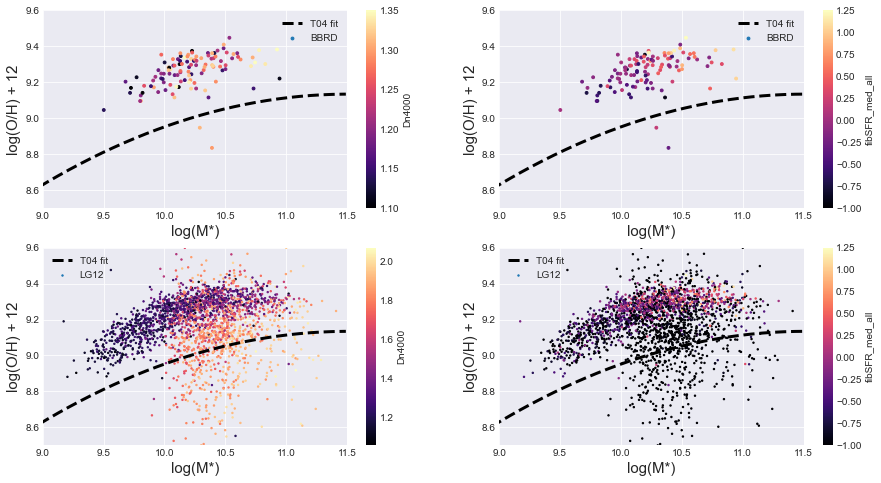

In [42]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15,8))
bbrd_Dn4000 = bbrd['Dn4000SDSSindx']
lg12_Dn4000 = lg12['Dn4000SDSSindx']
# BBRD
scatters1 = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_Dn4000, cmap='magma', label='BBRD', s=8)
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='Dn4000')
ax1.set_xlim(9.0, 11.5)
ax1.set_ylim(8.5, 9.6)
ax1.set_xlabel('log(M*)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters1.set_clim(1.10, 1.35)
ax1.legend()


scatters2 = ax2.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd['fibSFR_med_all'], cmap='magma', label='BBRD', s=8)
fig.colorbar(scatters2, ax=ax2, label='fibSFR_med_all')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_xlim(9.0, 11.5)
ax2.set_ylim(8.5, 9.6)
ax2.set_xlabel('log(M*)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
scatters2.set_clim(-1, 1.25)
ax2.legend()

# LG12
scatters3 = ax3.scatter(lg12_Mstar_med, lg12_niioii_Z, c=lg12_Dn4000, cmap='magma', label='LG12', s=2)
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='Dn4000')
ax3.set_xlim(9.0, 11.5)
ax3.set_ylim(8.5, 9.6)
ax3.set_xlabel('log(M*)', fontsize=15)
ax3.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
#scatters3.set_clim(1.10, 1.35)
ax3.legend()


scatters4 = ax4.scatter(lg12_Mstar_med, lg12_niioii_Z, c=lg12['fibSFR_med_all'], cmap='magma', label='LG12', s=2)
fig.colorbar(scatters4, ax=ax4, label='fibSFR_med_all')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_xlim(9.0, 11.5)
ax4.set_ylim(8.5, 9.6)
ax4.set_xlabel('log(M*)', fontsize=15)
ax4.set_ylabel('log(O/H) + 12', fontsize=15)
scatters4.set_clim(-1, 1.25)
ax4.legend()

plt.savefig('FMR_LG12_BBRD_dn4000_Hdelta.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)

In [43]:
lg12.columns

Index(['RASDSSinfo', 'DecSDSSinfo', 'zSDSSinfo',
       'HalphaSDSSline [1e-17*erg/cm^2/s]',
       'OIII5007SDSSline [1e-17*erg/cm^2/s]',
       'OIII4959SDSSline [1e-17*erg/cm^2/s]',
       'HbetaSDSSline [1e-17*erg/cm^2/s]', 'HdeltaSDSSline [1e-17*erg/cm^2/s]',
       'N6583SDSS [1e-17*erg/cm^2/s]', 'S6717SDSSline [1e-17*erg/cm^2/s]',
       'S6731SDSSline [1e-17*erg/cm^2/s]',
       'OII3726SDSSline [1e-17*erg/cm^2/s]',
       'OII3729SDSSline [1e-17*erg/cm^2/s]',
       'OI6300SDSSline [1e-17*erg/cm^2/s]', 'HalphaSDSSline_ERR',
       'OIII5007SDSSline_ERR', 'OIII4959SDSSline_ERR', 'HbetaSDSSline_ERR',
       'HdeltaSDSSline_ERR', 'N6583SDSS_ERR', 'S6717SDSSline_ERR',
       'S6731SDSSline_ERR', 'OII3726SDSSline_ERR', 'OII3729SDSSline_ERR',
       'OI6300SDSSline_ERR', 'Dn4000SDSSindx', 'petroRad', 'petroRadE',
       'petroR50', 'petroR50E', 'petroR90', 'petroR90E',
       'Metallicity_med(T04)', 'Metallicity_avg(T04)', 'Mstaravg_SDSStotlgm',
       'Mstarmed_SDSStotlgm', 'SFR_fl

## 4.1 Seperate low SFR galaxies to reduce scatter in the 10 < log(M*) > 11

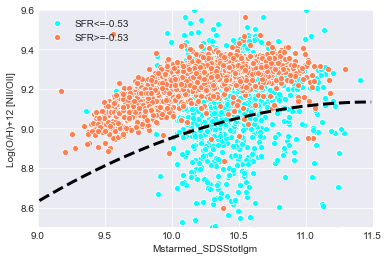

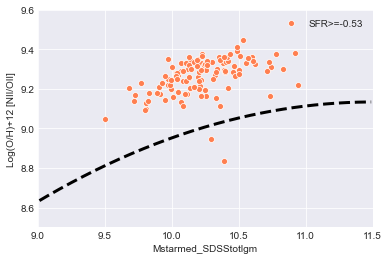

In [44]:
# Seperate low SFR galaxies to reduce scatter in the 10 < log(M*) > 11

lg12_medSFR = lg12['totalSFR_Med']
bbrd_medSFR = bbrd['totalSFR_Med']

# Make filter masking values below a specified SFR
lg12_mask = (lg12_medSFR <= -0.53) # the minimum value of the 
bbrd_mask = (bbrd_medSFR <= -0.53)

# Seperate data LG12
lg12_low_sfr04 = lg12[lg12_mask] # low SFR galaxies
lg12_high_sfr = lg12[~lg12_mask] # High SFR galaxies

bbrd_low_sfr04 = bbrd[bbrd_mask] # low SFR galaxies
bbrd_high_sfr = bbrd[~bbrd_mask] # High SFR galaxies


sns.scatterplot(lg12_low_sfr04['Mstarmed_SDSStotlgm'], lg12_low_sfr04['Log(O/H)+12 [NII/OII]'], color='aqua', label='SFR<=-0.53')
sns.scatterplot(lg12_high_sfr['Mstarmed_SDSStotlgm'], lg12_high_sfr['Log(O/H)+12 [NII/OII]'], color='coral', label='SFR>=-0.53')
plt.xlim(9.0, 11.5)
plt.ylim(8.5, 9.6)
plt.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
plt.savefig('lg12_sfr_cut.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)
plt.show()


sns.scatterplot(bbrd_low_sfr04['Mstarmed_SDSStotlgm'], bbrd_low_sfr04['Log(O/H)+12 [NII/OII]'], color='aqua', label='SFR<=-0.53')
sns.scatterplot(bbrd_high_sfr['Mstarmed_SDSStotlgm'], bbrd_high_sfr['Log(O/H)+12 [NII/OII]'], color='coral', label='SFR>=-0.53')
plt.xlim(9.0, 11.5)
plt.ylim(8.5, 9.6)
plt.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')


# Seperate low SFR galaxies to reduce scatter in the 10 < log(M*) > 11

#lg12_dn4000 = lg12['Dn4000SDSSindx']
## Make filter masking values below a specified SFR
#mask = (lg12_dn4000 <= 1.4) # the minimum value of the 
#
## Seperate data LG12
#lg12_low_dn4000 = lg12[mask] # low SFR galaxies
#lg12_high_dn4000 = lg12[~mask] # High SFR galaxies
#
#
## Assign new variables
#sns.scatterplot(lg12_low_dn4000['Mstarmed_SDSStotlgm'], lg12_low_dn4000['Log(O/H)+12 [NII/OII]'], color='aqua', #label='SFR<=-0.53')
#sns.scatterplot(lg12_high_dn4000['Mstarmed_SDSStotlgm'], lg12_high_dn4000['Log(O/H)+12 [NII/OII]'], color='coral', #label='SFR>=-0.53')
#plt.xlim(9.0, 11.5)
#plt.ylim(8.5, 9.6)
#plt.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')

## 4.1.1 Plot FMR with galaxies with SFR>-0.53:


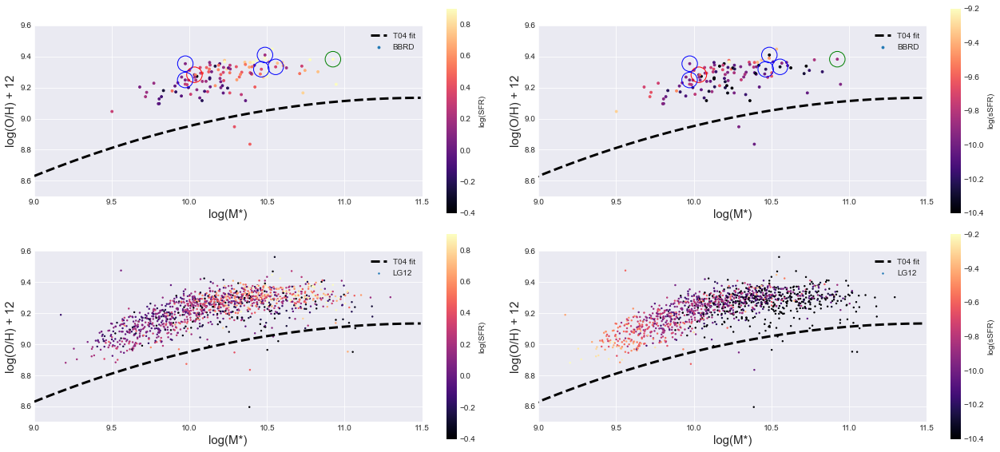

In [45]:
# Plot FMR with galaxies with SFR>-0.525:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18,8))

# BBRD
scatters1 = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_medSFR, cmap='magma', label='BBRD', s=8)
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='log(SFR)')
ax1.set_xlim(9.0, 11.5)
ax1.set_ylim(8.5, 9.6)
ax1.set_xlabel('log(M*)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters1.set_clim(-0.4, 0.9)
ax1.legend()

# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue')
ax1.set_aspect(1)
ax1.add_artist(g0)
ax1.add_artist(g1)
ax1.add_artist(g2)
ax1.add_artist(g3)
ax1.add_artist(g4)
ax1.add_artist(g5)
ax1.add_artist(g6)


scatters2 = ax2.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_med_sSFR, cmap='magma', label='BBRD', s=8)
fig.colorbar(scatters2, ax=ax2, label='log(sSFR)')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_xlim(9.0, 11.5)
ax2.set_ylim(8.5, 9.6)
ax2.set_xlabel('log(M*)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
scatters2.set_clim(-10.4, -9.2)
ax2.legend()

# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue')
ax2.set_aspect(1)
ax2.add_artist(g0)
ax2.add_artist(g1)
ax2.add_artist(g2)
ax2.add_artist(g3)
ax2.add_artist(g4)
ax2.add_artist(g5)
ax2.add_artist(g6)

# LG12
scatters3 = ax3.scatter(lg12_high_sfr['Mstarmed_SDSStotlgm'], lg12_high_sfr['Log(O/H)+12 [NII/OII]'], c=lg12_high_sfr['totalSFR_Med'], cmap='magma', label='LG12', s=2)
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='log(SFR)')
ax3.set_aspect(1)
ax3.set_xlim(9.0, 11.5)
ax3.set_ylim(8.5, 9.6)
ax3.set_xlabel('log(M*)', fontsize=15)
ax3.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters3.set_clim(-0.4, 0.9)
ax3.legend()


scatters4 = ax4.scatter(lg12_high_sfr['Mstarmed_SDSStotlgm'], lg12_high_sfr['Log(O/H)+12 [NII/OII]'], c=lg12_high_sfr['sSFR_med_all'], cmap='magma', label='LG12', s=2)
fig.colorbar(scatters4, ax=ax4, label='log(sSFR)')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_aspect(1)
ax4.set_xlim(9.0, 11.5)
ax4.set_ylim(8.5, 9.6)
ax4.set_xlabel('log(M*)', fontsize=15)
ax4.set_ylabel('log(O/H) + 12', fontsize=15)
scatters4.set_clim(-10.4, -9.2)
ax4.legend()
plt.tight_layout()

plt.savefig('FMR_LG12_BBRD_sfrcut_high.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)



In [219]:
# Mannucci et al 2010 Metallcity second order polynomial fit
mann_mass = np.linspace(9.0,11.5,30)
s = np.linspace(-1.5,1.5,30)
a = mann_mass-10

# Calculate metallicity as a function of SFR and a fixed mass
mann09_m925_fit = []
for i in s:
    m = 9.25 - 10
    man09_Zfit = 8.90 + 0.37*m - 0.14*s - 0.19*m**2 + 0.12*m*s - 0.054*s**2
    mann09_m925_fit.append(man09_Zfit)

def mannucci2010_fixed_mass(mass, sfr_list):
    mass = mass-10
    man09_Zfit = 8.90 + 0.37*mass - 0.14*sfr_list - 0.19*mass**2 + 0.12*mass*sfr_list - 0.054*sfr_list**2
    return man09_Zfit

In [220]:
mann10_m925_fit = mannucci2010_fixed_mass(9.25, s)
mann10_m970_fit = mannucci2010_fixed_mass(9.70, s)
mann10_m100_fit = mannucci2010_fixed_mass(10.0, s)
mann10_m103_fit = mannucci2010_fixed_mass(10.3, s)
mann10_m106_fit = mannucci2010_fixed_mass(10.6, s)
mann10_m109_fit = mannucci2010_fixed_mass(10.9, s)

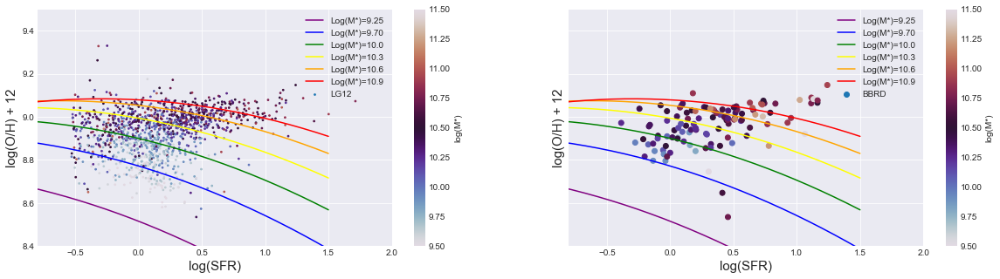

In [221]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20, 5), sharey=True, sharex=True)

scatters1 = ax1.scatter(lg12_high_sfr['totalSFR_Med'], lg12_high_sfr['Log(O/H)+12 [NII/OII]'] - 0.3, c=lg12_high_sfr['Mstarmed_SDSStotlgm'], cmap='twilight', label='LG12', s=3)
ax1.plot(s, mann10_m925_fit, color='purple', label='Log(M*)=9.25')
ax1.plot(s, mann10_m970_fit, color='blue',   label='Log(M*)=9.70')
ax1.plot(s, mann10_m100_fit, color='green',  label='Log(M*)=10.0')
ax1.plot(s, mann10_m103_fit, color='yellow', label='Log(M*)=10.3')
ax1.plot(s, mann10_m106_fit, color='orange', label='Log(M*)=10.6')
ax1.plot(s, mann10_m109_fit, color='red',    label='Log(M*)=10.9')
fig.colorbar(scatters1, ax=ax1, label='log(M*)')
ax1.set_xlim(-0.8, 2.0)
ax1.set_ylim(8.4, 9.5)
ax1.set_xlabel('log(SFR)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
scatters1.set_clim(9.5, 11.5)
ax1.legend()

ax2.scatter(bbrd_high_sfr['totalSFR_Med'], bbrd_high_sfr['Log(O/H)+12 [NII/OII]']-0.3, c=bbrd_high_sfr['Mstarmed_SDSStotlgm'], cmap='twilight', label='BBRD')
fig.colorbar(scatters1, ax=ax2, label='log(M*)')
ax2.plot(s, mann10_m925_fit, color='purple', label='Log(M*)=9.25')
ax2.plot(s, mann10_m970_fit, color='blue',   label='Log(M*)=9.70')
ax2.plot(s, mann10_m100_fit, color='green',  label='Log(M*)=10.0')
ax2.plot(s, mann10_m103_fit, color='yellow', label='Log(M*)=10.3')
ax2.plot(s, mann10_m106_fit, color='orange', label='Log(M*)=10.6')
ax2.plot(s, mann10_m109_fit, color='red',    label='Log(M*)=10.9')
ax2.set_xlabel('log(SFR)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
#scatters1.set_clim(-0.4, 0.9)
ax2.legend()



In [222]:
fig = px.scatter(lg12_high_sfr, x='totalSFR_Med', y='Log(O/H)+12 [NII/OII]', hover_data=['totalSFR_Med', 'Dn4000SDSSindx', 'Mstarmed_SDSStotlgm'], color='Mstarmed_SDSStotlgm', labels={'x':'Log(SFR)'}, title='LG12 Fudemental Metallcity Relation', color_continuous_scale='twilight', range_color=[9.0,11.0])
fig.show()

In [223]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly

plotly.offline.init_notebook_mode(connected=True)

fig = make_subplots(rows=1, cols=2, shared_yaxes=True, shared_xaxes=True, x_title='Log(SFR)', y_title='Log(O/H)+12')



fig.add_trace(go.Scatter(x=lg12_high_sfr['totalSFR_Med'], y=lg12_high_sfr['Log(O/H)+12 [NII/OII]'], mode='markers', marker=dict(
    color=lg12_high_sfr['Mstarmed_SDSStotlgm'], 
    coloraxis='coloraxis', size=5)), row=1, col=1)

fig.add_trace(go.Scatter(x=bbrd_high_sfr['totalSFR_Med'], y=bbrd_high_sfr['Log(O/H)+12 [NII/OII]'], mode='markers', 
marker=dict(
    color=bbrd_high_sfr['Mstarmed_SDSStotlgm'], coloraxis='coloraxis')), row=1, col=2)

fig.update_layout(height=400, width=1000, title_text="LG12 Log(SFR) vs Log(O/H)+12", coloraxis=dict(colorscale='blackbody', cmax=11.5, cmin=9.5), showlegend=False)
#fig.show()
plotly.offline.iplot(fig)

## 4.1.1a FMR interactive 3D plot using plotly

In [224]:
import plotly.express as px
import plotly.graph_objects as go

# LG12 FMR
fig = px.scatter_3d(lg12_high_sfr, x="Mstarmed_SDSStotlgm", y="Log(O/H)+12 [NII/OII]", z="totalSFR_Med", color="Dn4000SDSSindx")#, size='Dn4000SDSSindx')
fig.show()
fig.write_html("/Users/mmckay/Desktop/test1_plotly.html")

# LG12 MZ relation Dn4000indx
#fig = px.scatter_3d(lg12_high_sfr, x="Mstarmed_SDSStotlgm", y="Log(O/H)+12 [NII/OII]", z="Dn4000SDSSindx", color="Dn4000SDSSindx", opacity=0.7, #size_max=0.7, range_x=[9.4, 11.5], range_y=[8.5, 9.6], range_z=[1.4, 2.0])#, size='Dn4000SDSSindx')
#fig.show()
#fig.write_html("/Users/mmckay/Desktop/test2_plotly.html")

In [225]:
#fig = px.scatter(lg12_mass_11115, x='Mstarmed_SDSStotlgm', y='Log(O/H)+12 [NII/OII]', size='Dn4000SDSSindx',# hover_data=['totalSFR_Med'])
#fig.show()

fig = px.scatter(lg12_high_sfr, x='Mstarmed_SDSStotlgm', y='Log(O/H)+12 [NII/OII]', hover_data=['totalSFR_Med', 'Dn4000SDSSindx'], color='totalSFR_Med', labels={'x':'M*/Msun'}, title=' LG12 Fudemental Metallcity Relation', color_continuous_scale='Inferno', range_color=[-0.5,1.5])
fig.show()
fig.write_html("/Users/mmckay/Desktop/test_plotly.html")


#import plotly.graph_objects as go
#fig = go.Figure(data=go.Scatter(x=lg12_mass_10105['Mstarmed_SDSStotlgm'], y=lg12_mass_10105['Log(O/H)+12 #[NII/OII]'], mode='markers'))
#fig.show()

## 4.1.1b MZ relation with Dn4000 color


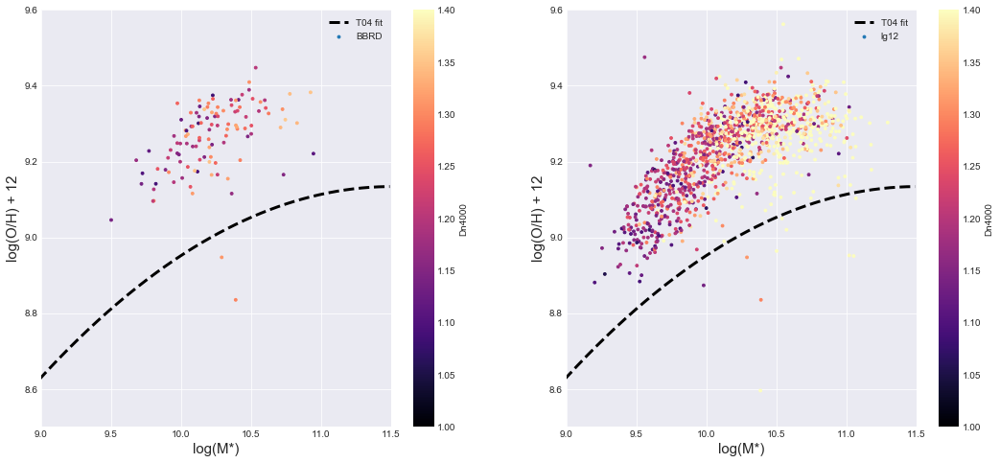

In [226]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
scatters1 = ax1.scatter(bbrd['Mstarmed_SDSStotlgm'], bbrd['Log(O/H)+12 [NII/OII]'], c=bbrd['Dn4000SDSSindx'], cmap='magma', label='BBRD', s=8)
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='Dn4000')
ax1.set_xlim(9.0, 11.5)
ax1.set_ylim(8.5, 9.6)
ax1.set_xlabel('log(M*)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters1.set_clim(1.0, 1.4)
ax1.legend()

scatters2 = ax2.scatter(lg12_high_sfr['Mstarmed_SDSStotlgm'], lg12_high_sfr['Log(O/H)+12 [NII/OII]'], c=lg12_high_sfr['Dn4000SDSSindx'], cmap='magma', label='lg12', s=8)
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters2, ax=ax2, label='Dn4000')
ax2.set_xlim(9.0, 11.5)
ax2.set_ylim(8.5, 9.6)
ax2.set_xlabel('log(M*)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
#ax2.set_clabel()
scatters2.set_clim(1.0, 1.4)
ax2.legend()

plt.savefig('highsf_FMR_dn4000.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)

## 4.1.2 Plot FMR with galaxies with SFR<-0.53:


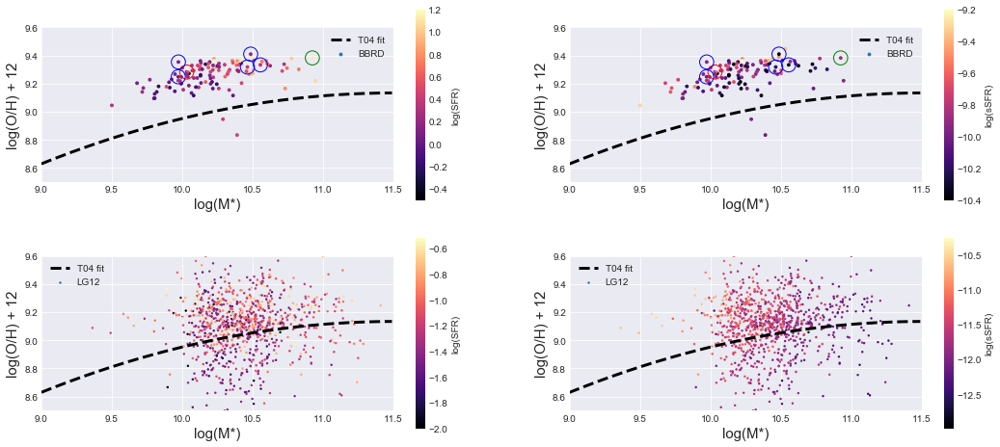

In [227]:
# Plot FMR with galaxies with SFR>-0.525:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18,8))

# BBRD
scatters1 = ax1.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_medSFR, cmap='magma', label='BBRD', s=8)
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='log(SFR)')
ax1.set_xlim(9.0, 11.5)
ax1.set_ylim(8.5, 9.6)
ax1.set_xlabel('log(M*)', fontsize=15)
ax1.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters1.set_clim(-0.5, 1.2)
ax1.legend()

# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue')
ax1.set_aspect(1)
ax1.add_artist(g0)
ax1.add_artist(g1)
ax1.add_artist(g2)
ax1.add_artist(g3)
ax1.add_artist(g4)
ax1.add_artist(g5)
ax1.add_artist(g6)


scatters2 = ax2.scatter(bbrd_Mstar_med, bbrd_niioii_Z, c=bbrd_med_sSFR, cmap='magma', label='BBRD', s=8)
fig.colorbar(scatters2, ax=ax2, label='log(sSFR)')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_xlim(9.0, 11.5)
ax2.set_ylim(8.5, 9.6)
ax2.set_xlabel('log(M*)', fontsize=15)
ax2.set_ylabel('log(O/H) + 12', fontsize=15)
scatters2.set_clim(-10.4, -9.2)
ax2.legend()

# Draw circle around MaNGA galaxies we have data for
g0 = plt.Circle((manga_mass.iloc[0], manga_Z.iloc[0]), 0.05, fill=False, color='red')
g1 = plt.Circle((manga_mass.iloc[1], manga_Z.iloc[1]), 0.05, fill=False, color='blue')
g2 = plt.Circle((manga_mass.iloc[2], manga_Z.iloc[2]), 0.05, fill=False, color='blue')
g3 = plt.Circle((manga_mass.iloc[3], manga_Z.iloc[3]), 0.05, fill=False, color='blue')
g4 = plt.Circle((manga_mass.iloc[4], manga_Z.iloc[4]), 0.05, fill=False, color='green')
g5 = plt.Circle((manga_mass.iloc[5], manga_Z.iloc[5]), 0.05, fill=False, color='blue')
g6 = plt.Circle((manga_mass.iloc[6], manga_Z.iloc[6]), 0.05, fill=False, color='blue')
ax2.set_aspect(1)
ax2.add_artist(g0)
ax2.add_artist(g1)
ax2.add_artist(g2)
ax2.add_artist(g3)
ax2.add_artist(g4)
ax2.add_artist(g5)
ax2.add_artist(g6)

# LG12
scatters3 = ax3.scatter(lg12_low_sfr04['Mstarmed_SDSStotlgm'], lg12_low_sfr04['Log(O/H)+12 [NII/OII]'], c=lg12_low_sfr04['totalSFR_Med'], cmap='magma', label='LG12', s=2)
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='log(SFR)')
ax3.set_aspect(1)
ax3.set_xlim(9.0, 11.5)
ax3.set_ylim(8.5, 9.6)
ax3.set_xlabel('log(M*)', fontsize=15)
ax3.set_ylabel('log(O/H) + 12', fontsize=15)
#ax1.set_clabel()
scatters3.set_clim(-2.0, -0.52)
ax3.legend()


scatters4 = ax4.scatter(lg12_low_sfr04['Mstarmed_SDSStotlgm'], lg12_low_sfr04['Log(O/H)+12 [NII/OII]'], c=lg12_low_sfr04['sSFR_med_all'], cmap='magma', label='LG12', s=2)
fig.colorbar(scatters4, ax=ax4, label='log(sSFR)')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_aspect(1)
ax4.set_xlim(9.0, 11.5)
ax4.set_ylim(8.5, 9.6)
ax4.set_xlabel('log(M*)', fontsize=15)
ax4.set_ylabel('log(O/H) + 12', fontsize=15)
#scatters4.set_clim(-10.4, -9.2)
ax4.legend()

plt.savefig('FMR_LG12_BBRD_sfrcut_low.jpeg', overwrite=True, bbox_inches = 'tight', pad_inches = 0)


## 4.2 Seperate LR12 and BBRD in Mass bins

In [228]:
lg12_mass = lg12_high_sfr['Mstarmed_SDSStotlgm']
bbrd_mass = bbrd_high_sfr['Mstarmed_SDSStotlgm']

# Make filter masking values with in mass range
# LG12
lg12_mask_995 = (lg12_mass >= 9.0) & (lg12_mass <= 9.5) # 9.0 <= log(M*) >= 9.5 
lg12_mask_9510 = (lg12_mass > 9.5) & (lg12_mass <= 10.0) # 9.5 <= log(M*) >= 10.0 
lg12_mask_10105 = (lg12_mass > 10.0) & (lg12_mass <= 10.5) # 10.0 <= log(M*) >= 10.5 
lg12_mask_10511 = (lg12_mass > 10.5) & (lg12_mass <= 11.0) # 10.5 <= log(M*) >= 11.0 
lg12_mask_11115 = (lg12_mass > 11.0) & (lg12_mass <= 11.5) # 11.0 <= log(M*) >= 11.5

# Apply Mask
lg12_mass_995 = lg12_high_sfr[lg12_mask_995]
lg12_mass_9510 = lg12_high_sfr[lg12_mask_9510]
lg12_mass_10105 = lg12_high_sfr[lg12_mask_10105]
lg12_mass_10511 = lg12_high_sfr[lg12_mask_10511]
lg12_mass_11115 = lg12_high_sfr[lg12_mask_11115]


# BBRD
bbrd_mask_995 = (bbrd_mass >= 9.0) & (bbrd_mass <= 9.5) # 9.0 <= log(M*) >= 9.5 
bbrd_mask_9510 = (bbrd_mass > 9.5) & (bbrd_mass <= 10.0) # 9.5 <= log(M*) >= 10.0 
bbrd_mask_10105 = (bbrd_mass > 10.0) & (bbrd_mass <= 10.5) # 10.0 <= log(M*) >= 10.5 
bbrd_mask_10511 = (bbrd_mass > 10.5) & (bbrd_mass <= 11.0) # 10.5 <= log(M*) >= 11.0 
bbrd_mask_11115 = (bbrd_mass > 11.0) & (bbrd_mass <= 11.5) # 11.0 <= log(M*) >= 11.5

# Apply Mask
bbrd_mass_995 =   bbrd_high_sfr[bbrd_mask_995]
bbrd_mass_9510 =  bbrd_high_sfr[bbrd_mask_9510]
bbrd_mass_10105 = bbrd_high_sfr[bbrd_mask_10105]
bbrd_mass_10511 = bbrd_high_sfr[bbrd_mask_10511]
bbrd_mass_11115 = bbrd_high_sfr[bbrd_mask_11115]

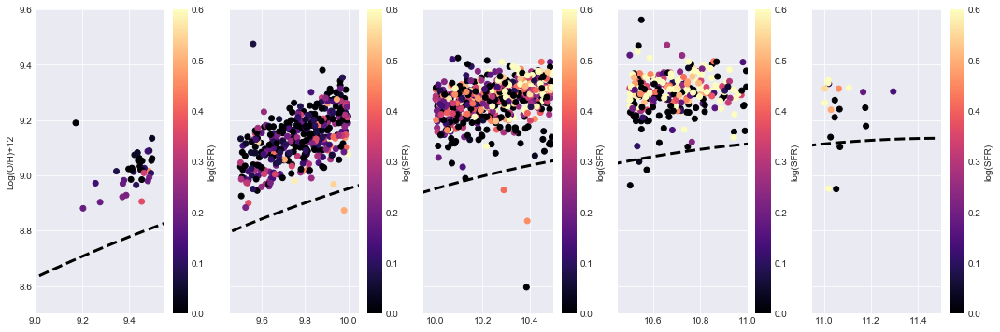

In [229]:
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(, 4)
fig, ((ax1, ax2, ax3, ax4, ax5)) = plt.subplots(1, 5, figsize=(18, 6), sharey=True)
ax1.set_ylabel('Log(O/H)+12')
ax1.set_ylim(8.5, 9.6)

# 9.0 <= log(M*) >= 9.5
ax1.set_xlim(9.0, 9.55)
scatters1 = ax1.scatter(lg12_mass_995['Mstarmed_SDSStotlgm'], lg12_mass_995['Log(O/H)+12 [NII/OII]'], c=lg12_mass_995['totalSFR_Med'], cmap='magma')
#ax1.scatter(bbrd_mass_995['Mstarmed_SDSStotlgm'], bbrd_mass_995['Log(O/H)+12 [NII/OII]'], color='aqua')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='log(SFR)')
scatters1.set_clim(0.0, 0.6)


# 9.5 <= log(M*) >= 10.0
ax2.set_xlim(9.45, 10.05)
scatters2 = ax2.scatter(lg12_mass_9510['Mstarmed_SDSStotlgm'], lg12_mass_9510['Log(O/H)+12 [NII/OII]'], c=lg12_mass_9510['totalSFR_Med'], cmap='magma')
#ax2.scatter(bbrd_mass_9510['Mstarmed_SDSStotlgm'], bbrd_mass_9510['Log(O/H)+12 [NII/OII]'], color='aqua')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters2, ax=ax2, label='log(SFR)')
scatters2.set_clim(0.0, 0.6)



# 10.0 <= log(M*) >= 10.5
ax3.set_xlim(9.95, 10.5)
scatters3 = ax3.scatter(lg12_mass_10105['Mstarmed_SDSStotlgm'], lg12_mass_10105['Log(O/H)+12 [NII/OII]'], c=lg12_mass_10105['totalSFR_Med'], cmap='magma')
#ax3.scatter(bbrd_mass_10105['Mstarmed_SDSStotlgm'], bbrd_mass_10105['Log(O/H)+12 [NII/OII]'], color='aqua')
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='log(SFR)')
scatters3.set_clim(0.0, 0.6)


# 10.5 <= log(M*) >= 11.0
ax4.set_xlim(10.45, 11.0)
scatters4 = ax4.scatter(lg12_mass_10511['Mstarmed_SDSStotlgm'], lg12_mass_10511['Log(O/H)+12 [NII/OII]'], c=lg12_mass_10511['totalSFR_Med'], cmap='magma')
#ax4.scatter(bbrd_mass_10511['Mstarmed_SDSStotlgm'], bbrd_mass_10511['Log(O/H)+12 [NII/OII]'], color='aqua')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters4, ax=ax4, label='log(SFR)')
scatters4.set_clim(0.0, 0.6)


# 11.0 <= log(M*) >= 11.5
ax5.set_xlim(10.95, 11.5)
scatters5 = ax5.scatter(lg12_mass_11115['Mstarmed_SDSStotlgm'], lg12_mass_11115['Log(O/H)+12 [NII/OII]'], c=lg12_mass_11115['totalSFR_Med'], cmap='magma')
#ax5.scatter(bbrd_mass_11115['Mstarmed_SDSStotlgm'], bbrd_mass_11115['Log(O/H)+12 [NII/OII]'], color='aqua')
ax5.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters5, ax=ax5, label='log(SFR)')
scatters5.set_clim(0.0, 0.6)



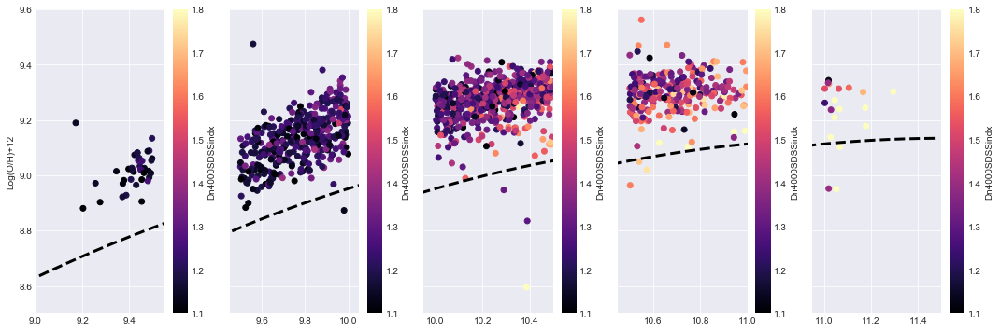

In [230]:
fig, ((ax1, ax2, ax3, ax4, ax5)) = plt.subplots(1, 5, figsize=(18, 6), sharey=True)
ax1.set_ylabel('Log(O/H)+12')
ax1.set_ylim(8.5, 9.6)

# 9.0 <= log(M*) >= 9.5
ax1.set_xlim(9.0, 9.55)
scatters1 = ax1.scatter(lg12_mass_995['Mstarmed_SDSStotlgm'], lg12_mass_995['Log(O/H)+12 [NII/OII]'], c=lg12_mass_995['Dn4000SDSSindx'], cmap='magma')
#ax1.scatter(bbrd_mass_995['Mstarmed_SDSStotlgm'], bbrd_mass_995['Log(O/H)+12 [NII/OII]'], color='aqua')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters1, ax=ax1, label='Dn4000SDSSindx')
scatters1.set_clim(1.1, 1.8)


# 9.5 <= log(M*) >= 10.0
ax2.set_xlim(9.45, 10.05)
scatters2 = ax2.scatter(lg12_mass_9510['Mstarmed_SDSStotlgm'], lg12_mass_9510['Log(O/H)+12 [NII/OII]'], c=lg12_mass_9510['Dn4000SDSSindx'], cmap='magma')
#ax2.scatter(bbrd_mass_9510['Mstarmed_SDSStotlgm'], bbrd_mass_9510['Log(O/H)+12 [NII/OII]'], color='aqua')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters2, ax=ax2, label='Dn4000SDSSindx')
scatters2.set_clim(1.1, 1.8)



# 10.0 <= log(M*) >= 10.5
ax3.set_xlim(9.95, 10.5)
scatters3 = ax3.scatter(lg12_mass_10105['Mstarmed_SDSStotlgm'], lg12_mass_10105['Log(O/H)+12 [NII/OII]'], c=lg12_mass_10105['Dn4000SDSSindx'], cmap='magma')
#ax3.scatter(bbrd_mass_10105['Mstarmed_SDSStotlgm'], bbrd_mass_10105['Log(O/H)+12 [NII/OII]'], color='aqua')
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters3, ax=ax3, label='Dn4000SDSSindx')
scatters3.set_clim(1.1, 1.8)


# 10.5 <= log(M*) >= 11.0
ax4.set_xlim(10.45, 11.0)
scatters4 = ax4.scatter(lg12_mass_10511['Mstarmed_SDSStotlgm'], lg12_mass_10511['Log(O/H)+12 [NII/OII]'], c=lg12_mass_10511['Dn4000SDSSindx'], cmap='magma')
#ax4.scatter(bbrd_mass_10511['Mstarmed_SDSStotlgm'], bbrd_mass_10511['Log(O/H)+12 [NII/OII]'], color='aqua')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters4, ax=ax4, label='Dn4000SDSSindx')
scatters4.set_clim(1.1, 1.8)


# 11.0 <= log(M*) >= 11.5
ax5.set_xlim(10.95, 11.5)
scatters5 = ax5.scatter(lg12_mass_11115['Mstarmed_SDSStotlgm'], lg12_mass_11115['Log(O/H)+12 [NII/OII]'], c=lg12_mass_11115['Dn4000SDSSindx'], cmap='magma')
#ax5.scatter(bbrd_mass_11115['Mstarmed_SDSStotlgm'], bbrd_mass_11115['Log(O/H)+12 [NII/OII]'], color='aqua')
ax5.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
fig.colorbar(scatters5, ax=ax5, label='Dn4000SDSSindx')
scatters5.set_clim(1.1, 1.8)

## 4.3 Seperate LR12 and BBRD in Metallicty bins (LG12 galaxies SFR>=-0.53)

In [231]:
lg12_Z = lg12_high_sfr['Log(O/H)+12 [NII/OII]']
bbrd_Z = bbrd_high_sfr['Log(O/H)+12 [NII/OII]']

# Make filter masking values with in Z range
# LG12
lg12_mask_7086 = (lg12_Z <= 8.6)                  # log(O/H)+12 <= 8.6
lg12_mask_8688 = (lg12_Z > 8.6) & (lg12_Z <= 8.8) # 8.6 < log(O/H)+12 <= 8.8
lg12_mask_8890 = (lg12_Z > 8.8) & (lg12_Z <= 9.0) # 8.8 < log(O/H)+12 <= 9.0
lg12_mask_9092 = (lg12_Z > 9.0) & (lg12_Z <= 9.2) # 9.0 < log(O/H)+12 <= 9.2
lg12_mask_9294 = (lg12_Z > 9.2) & (lg12_Z <= 9.4) # 9.2 < log(O/H)+12 <= 9.4
lg12_mask_9497 = (lg12_Z > 9.4) & (lg12_Z <= 9.7) # 9.4 < log(O/H)+12 <= 9.7

# Apply Mask
lg12_Z_7086 = lg12_high_sfr[lg12_mask_7086]
lg12_Z_8688 = lg12_high_sfr[lg12_mask_8688]
lg12_Z_8890 = lg12_high_sfr[lg12_mask_8890]
lg12_Z_9092 = lg12_high_sfr[lg12_mask_9092]
lg12_Z_9294 = lg12_high_sfr[lg12_mask_9294]
lg12_Z_9497 = lg12_high_sfr[lg12_mask_9497]


# BBRD
bbrd_mask_7086 = (bbrd_Z <= 8.6)                  # log(O/H)+12 <= 8.6
bbrd_mask_8688 = (bbrd_Z > 8.6) & (bbrd_Z <= 8.8) # 8.6 < log(O/H)+12 <= 8.8
bbrd_mask_8890 = (bbrd_Z > 8.8) & (bbrd_Z <= 9.0) # 8.8 < log(O/H)+12 <= 9.0
bbrd_mask_9092 = (bbrd_Z > 9.0) & (bbrd_Z <= 9.2) # 9.0 < log(O/H)+12 <= 9.2
bbrd_mask_9294 = (bbrd_Z > 9.2) & (bbrd_Z <= 9.4) # 9.2 < log(O/H)+12 <= 9.4
bbrd_mask_9497 = (bbrd_Z > 9.4) & (bbrd_Z <= 9.7) # 9.4 < log(O/H)+12 <= 9.7

# Apply Mask
bbrd_Z_7086 = bbrd_high_sfr[bbrd_mask_7086]
bbrd_Z_8688 = bbrd_high_sfr[bbrd_mask_8688]
bbrd_Z_8890 = bbrd_high_sfr[bbrd_mask_8890]
bbrd_Z_9092 = bbrd_high_sfr[bbrd_mask_9092]
bbrd_Z_9294 = bbrd_high_sfr[bbrd_mask_9294]
bbrd_Z_9497 = bbrd_high_sfr[bbrd_mask_9497]



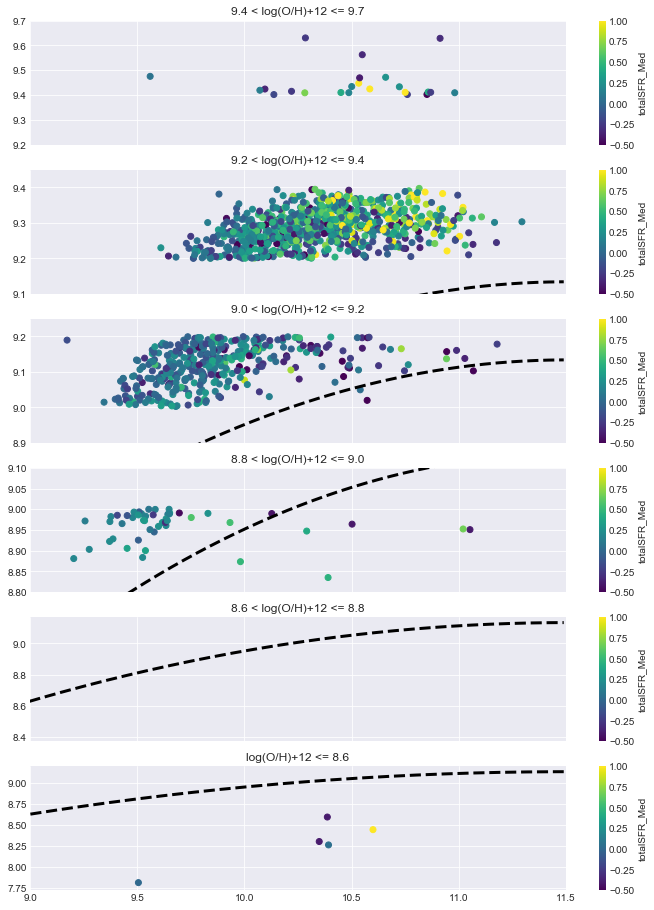

In [232]:
fig, ((ax1, ax2, ax3, ax4, ax5, ax6)) = plt.subplots(6, 1, figsize=(12, 16), sharex=True)

scatters1 = ax1.scatter(lg12_Z_9497['Mstarmed_SDSStotlgm'], lg12_Z_9497['Log(O/H)+12 [NII/OII]'], c=lg12_Z_9497['totalSFR_Med'], cmap='viridis')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax1.set_title('9.4 < log(O/H)+12 <= 9.7')
fig.colorbar(scatters1, ax=ax1, label='totalSFR_Med')
ax1.set_xlim(9.0,11.5)
ax1.set_ylim(9.2,9.7)
scatters1.set_clim(-0.5, 1.0)

scatters2 = ax2.scatter(lg12_Z_9294['Mstarmed_SDSStotlgm'], lg12_Z_9294['Log(O/H)+12 [NII/OII]'], c=lg12_Z_9294['totalSFR_Med'], cmap='viridis')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_title('9.2 < log(O/H)+12 <= 9.4')
fig.colorbar(scatters2, ax=ax2, label='totalSFR_Med')
ax2.set_ylim(9.1,9.45)
scatters2.set_clim(-0.5, 1.0)


scatters3 = ax3.scatter(lg12_Z_9092['Mstarmed_SDSStotlgm'], lg12_Z_9092['Log(O/H)+12 [NII/OII]'], c=lg12_Z_9092['totalSFR_Med'], cmap='viridis')
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax3.set_title('9.0 < log(O/H)+12 <= 9.2')
fig.colorbar(scatters3, ax=ax3, label='totalSFR_Med')
ax3.set_ylim(8.9,9.25)
scatters3.set_clim(-0.5, 1.0)

scatters4 = ax4.scatter(lg12_Z_8890['Mstarmed_SDSStotlgm'], lg12_Z_8890['Log(O/H)+12 [NII/OII]'], c=lg12_Z_8890['totalSFR_Med'], cmap='viridis')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_title('8.8 < log(O/H)+12 <= 9.0')
fig.colorbar(scatters4, ax=ax4, label='totalSFR_Med')
ax4.set_ylim(8.8,9.1)
scatters4.set_clim(-0.5, 1.0)

scatters5 = ax5.scatter(lg12_Z_8688['Mstarmed_SDSStotlgm'], lg12_Z_8688['Log(O/H)+12 [NII/OII]'], c=lg12_Z_8688['totalSFR_Med'], cmap='viridis')
ax5.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax5.set_title('8.6 < log(O/H)+12 <= 8.8')
fig.colorbar(scatters5, ax=ax5, label='totalSFR_Med')
#ax5.set_ylim(9.3,9.8)
scatters5.set_clim(-0.5, 1.0)

scatters6 = ax6.scatter(lg12_Z_7086['Mstarmed_SDSStotlgm'], lg12_Z_7086['Log(O/H)+12 [NII/OII]'], c=lg12_Z_7086['totalSFR_Med'], cmap='viridis')
ax6.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax6.set_title('log(O/H)+12 <= 8.6')
fig.colorbar(scatters6, ax=ax6, label='totalSFR_Med')
#ax6.set_ylim(9.3,9.8)
scatters6.set_clim(-0.5, 1.0)

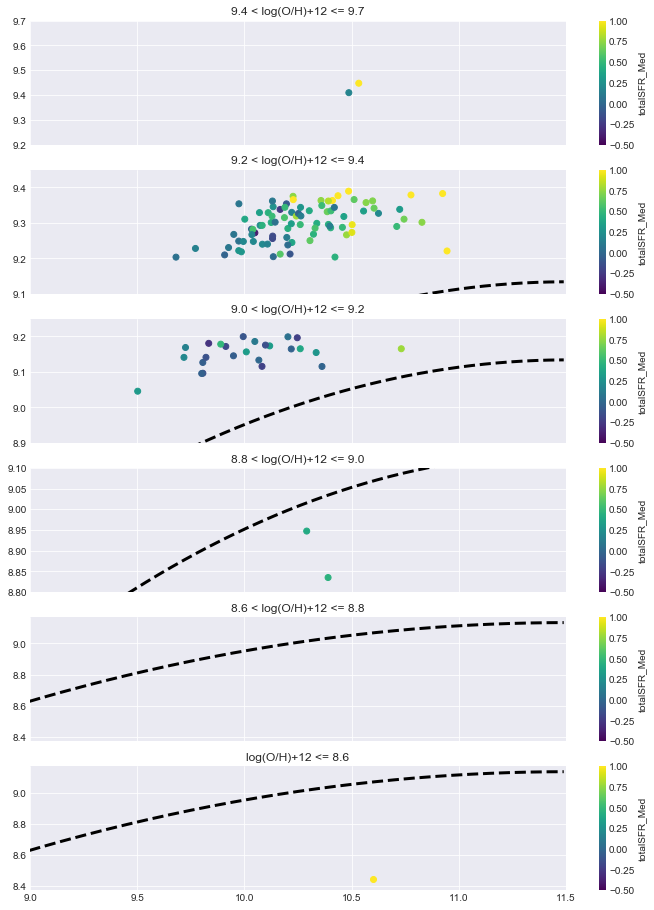

In [233]:
fig, ((ax1, ax2, ax3, ax4, ax5, ax6)) = plt.subplots(6, 1, figsize=(12, 16), sharex=True)

scatters1 = ax1.scatter(bbrd_Z_9497['Mstarmed_SDSStotlgm'], bbrd_Z_9497['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_9497['totalSFR_Med'], cmap='viridis')
ax1.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax1.set_title('9.4 < log(O/H)+12 <= 9.7')
fig.colorbar(scatters1, ax=ax1, label='totalSFR_Med')
ax1.set_xlim(9.0,11.5)
ax1.set_ylim(9.2,9.7)
scatters1.set_clim(-0.5, 1.0)

scatters2 = ax2.scatter(bbrd_Z_9294['Mstarmed_SDSStotlgm'], bbrd_Z_9294['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_9294['totalSFR_Med'], cmap='viridis')
ax2.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax2.set_title('9.2 < log(O/H)+12 <= 9.4')
fig.colorbar(scatters2, ax=ax2, label='totalSFR_Med')
ax2.set_ylim(9.1,9.45)
scatters2.set_clim(-0.5, 1.0)


scatters3 = ax3.scatter(bbrd_Z_9092['Mstarmed_SDSStotlgm'], bbrd_Z_9092['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_9092['totalSFR_Med'], cmap='viridis')
ax3.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax3.set_title('9.0 < log(O/H)+12 <= 9.2')
fig.colorbar(scatters3, ax=ax3, label='totalSFR_Med')
ax3.set_ylim(8.9,9.25)
scatters3.set_clim(-0.5, 1.0)

scatters4 = ax4.scatter(bbrd_Z_8890['Mstarmed_SDSStotlgm'], bbrd_Z_8890['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_8890['totalSFR_Med'], cmap='viridis')
ax4.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax4.set_title('8.8 < log(O/H)+12 <= 9.0')
fig.colorbar(scatters4, ax=ax4, label='totalSFR_Med')
ax4.set_ylim(8.8,9.1)
scatters4.set_clim(-0.5, 1.0)

scatters5 = ax5.scatter(bbrd_Z_8688['Mstarmed_SDSStotlgm'], bbrd_Z_8688['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_8688['totalSFR_Med'], cmap='viridis')
ax5.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax5.set_title('8.6 < log(O/H)+12 <= 8.8')
fig.colorbar(scatters5, ax=ax5, label='totalSFR_Med')
#ax5.set_ylim(9.3,9.8)
scatters5.set_clim(-0.5, 1.0)

scatters6 = ax6.scatter(bbrd_Z_7086['Mstarmed_SDSStotlgm'], bbrd_Z_7086['Log(O/H)+12 [NII/OII]'], c=bbrd_Z_7086['totalSFR_Med'], cmap='viridis')
ax6.plot(mass, T04_Z_fit, label='T04 fit', color='black', linewidth=3, linestyle='--')
ax6.set_title('log(O/H)+12 <= 8.6')
fig.colorbar(scatters6, ax=ax6, label='totalSFR_Med')
#ax6.set_ylim(9.3,9.8)
scatters6.set_clim(-0.5, 1.0)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

## Data analysis with interactive plots

In [234]:
fig = go.Figure(data=go.Scatter(x = lg12_mass_10105['Mstarmed_SDSStotlgm'],
    y = lg12_mass_10105['Log(O/H)+12 [NII/OII]'],
    mode='markers',
    marker=dict(
        size=8,
        color=lg12_mass_10105['totalSFR_Med'], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        showscale=True
    )
))

fig.show()

In [235]:
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=lg12_mass_10105['Mstarmed_SDSStotlgm'], y=lg12_mass_10105['Log(O/H)+12 [NII/OII]'], mode='markers', name='markers'))
fig.add_trace(go.Scatter(x=mass, y=T04_Z_fit,
                    mode='lines',
                    name='lines+markers'))

In [236]:
fig = px.scatter_matrix(lg12_high_sfr, dimensions=["HalphaSDSSline [1e-17*erg/cm^2/s]", "sSFR_med_all", "Log(O/H)+12 [NII/OII]", "avgSFRD"], color="totalSFR_Med")
fig.show()

In [237]:
fig = px.scatter_3d(lg12_high_sfr, x="Mstarmed_SDSStotlgm", y="Log(O/H)+12 [NII/OII]", z="totalSFR_Med", color="totalSFR_Med")#, size='Dn4000SDSSindx')
fig.show()
fig.write_html("/Users/mmckay/Desktop/test1_plotly.html")

In [238]:
lg12_mass_995.columns

Index(['RASDSSinfo', 'DecSDSSinfo', 'zSDSSinfo',
       'HalphaSDSSline [1e-17*erg/cm^2/s]',
       'OIII5007SDSSline [1e-17*erg/cm^2/s]',
       'OIII4959SDSSline [1e-17*erg/cm^2/s]',
       'HbetaSDSSline [1e-17*erg/cm^2/s]', 'HdeltaSDSSline [1e-17*erg/cm^2/s]',
       'N6583SDSS [1e-17*erg/cm^2/s]', 'S6717SDSSline [1e-17*erg/cm^2/s]',
       'S6731SDSSline [1e-17*erg/cm^2/s]',
       'OII3726SDSSline [1e-17*erg/cm^2/s]',
       'OII3729SDSSline [1e-17*erg/cm^2/s]',
       'OI6300SDSSline [1e-17*erg/cm^2/s]', 'HalphaSDSSline_ERR',
       'OIII5007SDSSline_ERR', 'OIII4959SDSSline_ERR', 'HbetaSDSSline_ERR',
       'HdeltaSDSSline_ERR', 'N6583SDSS_ERR', 'S6717SDSSline_ERR',
       'S6731SDSSline_ERR', 'OII3726SDSSline_ERR', 'OII3729SDSSline_ERR',
       'OI6300SDSSline_ERR', 'Dn4000SDSSindx', 'petroRad', 'petroRadE',
       'petroR50', 'petroR50E', 'petroR90', 'petroR90E',
       'Metallicity_med(T04)', 'Metallicity_avg(T04)', 'Mstaravg_SDSStotlgm',
       'Mstarmed_SDSStotlgm', 'SFR_fl

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

In [239]:
lg12.mean()

RASDSSinfo                             1.841211e+02
DecSDSSinfo                            2.602611e+01
zSDSSinfo                              3.917593e-02
HalphaSDSSline [1e-17*erg/cm^2/s]      4.841287e+02
OIII5007SDSSline [1e-17*erg/cm^2/s]    6.449520e+01
                                           ...     
OII3729_kcorr                         -3.108814e+04
Log(O/H)+12 [NII/OII]                  9.158570e+00
Log(O/H)+12 [R23]                     -1.579047e+31
NII/Halpha                            -3.831767e-01
OIII/Hbeta                                     -inf
Length: 61, dtype: float64